In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Directory to save checkpoints
drive_checkpoint_dir = '/content/drive/MyDrive/Fruit_Quality_Checkpoints'
if not os.path.exists(drive_checkpoint_dir):
    os.makedirs(drive_checkpoint_dir)


Mounted at /content/drive


In [ ]:
import zipfile
import gdown

# Download dataset
url = 'https://drive.google.com/uc?id=1JDluH5HeqB7q_ukgeEGP4udWxdOOg2LE'
output = 'FruitsData.zip'
gdown.download(url, output, quiet=False)

# Unzip the dataset
with zipfile.ZipFile('FruitsData.zip', 'r') as zip_ref:
    zip_ref.extractall('FruitsData')


Downloading...
From (original): https://drive.google.com/uc?id=1JDluH5HeqB7q_ukgeEGP4udWxdOOg2LE
From (redirected): https://drive.google.com/uc?id=1JDluH5HeqB7q_ukgeEGP4udWxdOOg2LE&confirm=t&uuid=d148e7e8-7104-43ab-8122-2ab094a5dac0
To: /content/FruitsData.zip
100%|██████████| 3.25G/3.25G [00:51<00:00, 63.4MB/s]


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import seaborn as sns
from PIL import Image

In [ ]:
base_dir = 'FruitsData'
train_dir = os.path.join(base_dir)

In [ ]:
!pip install PyWavelets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 50.1 MB/s eta 0:00:00


In [ ]:
from PIL import Image, ImageFilter, ImageOps
import cv2
import pywt
# Image enhancement functions
def enhance_image(image_path):
    img = Image.open(image_path)
    img_contrast = ImageOps.autocontrast(img)
    img_smooth = img.filter(ImageFilter.GaussianBlur(radius=2))
    img_sharp = img.filter(ImageFilter.SHARPEN)
    img_negative = ImageOps.invert(img)
    return img, img_contrast, img_smooth, img_sharp, img_negative

In [ ]:
# Display enhanced images
def display_enhanced_images(image_path):
    original, contrast, smooth, sharp, negative = enhance_image(image_path)
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 5, 1)
    plt.imshow(original)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 5, 2)
    plt.imshow(contrast)
    plt.title('Contrast Adjusted')
    plt.axis('off')

    plt.subplot(1, 5, 3)
    plt.imshow(smooth)
    plt.title('Smoothed')
    plt.axis('off')

    plt.subplot(1, 5, 4)
    plt.imshow(sharp)
    plt.title('Sharpened')
    plt.axis('off')

    plt.subplot(1, 5, 5)
    plt.imshow(negative)
    plt.title('Negative Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
# Image segmentation: Thresholding and Edge Detection
def segment_image(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Thresholding
    _, thresh = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

    # Edge Detection
    edges = cv2.Canny(img, 100, 200)

    plt.figure(figsize=(15, 10))
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(thresh, cmap='gray')
    plt.title('Thresholded Image')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(edges, cmap='gray')
    plt.title('Edge Detected Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
# Morphological operations
def morphological_operations(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    kernel = np.ones((5, 5), np.uint8)

    # Erosion and Dilation
    erosion = cv2.erode(img, kernel, iterations=1)
    dilation = cv2.dilate(img, kernel, iterations=1)

    plt.figure(figsize=(15, 10))
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(erosion, cmap='gray')
    plt.title('Erosion')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(dilation, cmap='gray')
    plt.title('Dilation')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
def wavelet_transform(image_path):
    # Read the image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Perform 2D Discrete Wavelet Transform using pywt
    coeffs = pywt.dwt2(img, 'haar')
    cA, (cH, cV, cD) = coeffs

    # Plotting the original and transformed coefficients
    plt.figure(figsize=(15, 10))
    plt.subplot(1, 4, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(cA, cmap='gray')
    plt.title('Approximation Coefficients')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(cH, cmap='gray')
    plt.title('Horizontal Coefficients')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.imshow(cV, cmap='gray')
    plt.title('Vertical Coefficients')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
# Motion Analysis: Optical Flow
def optical_flow(video_path):
    cap = cv2.VideoCapture(video_path)
    ret, old_frame = cap.read()
    old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
    old_gray = cv2.GaussianBlur(old_gray, (5, 5), 0)

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        frame_gray = cv2.GaussianBlur(frame_gray, (5, 5), 0)

        # Optical flow calculation
        flow = cv2.calcOpticalFlowFarneback(old_gray, frame_gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)
        magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])
        hsv = np.zeros_like(frame)
        hsv[..., 1] = 255
        hsv[..., 0] = angle * 180 / np.pi / 2
        hsv[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)
        rgb_flow = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

        cv2.imshow('Optical Flow', rgb_flow)
        if cv2.waitKey(30) & 0xFF == 27:  # Escape key
            break

        old_gray = frame_gray

    cap.release()
    cv2.destroyAllWindows()

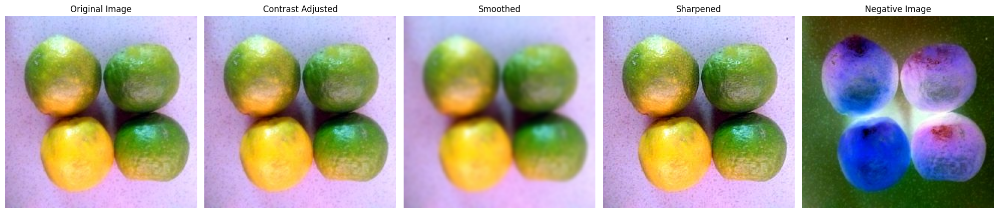

In [ ]:
sample_image_path = os.path.join(train_dir, 'Good Quality_Fruits', 'Orange_Good', os.listdir(os.path.join(train_dir, 'Good Quality_Fruits', 'Orange_Good'))[0])
# Added another os.path.join and 'Orange_Good' to ensure a file is selected within the 'Orange_Good' directory.
display_enhanced_images(sample_image_path)

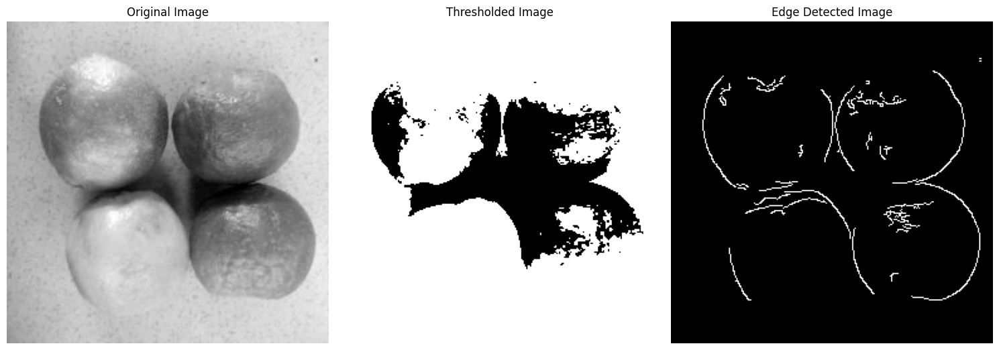

In [ ]:
segment_image(sample_image_path)

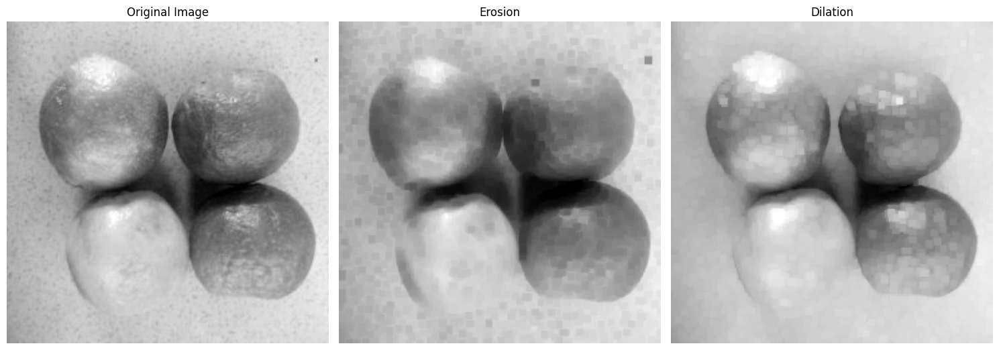

In [ ]:
morphological_operations(sample_image_path)

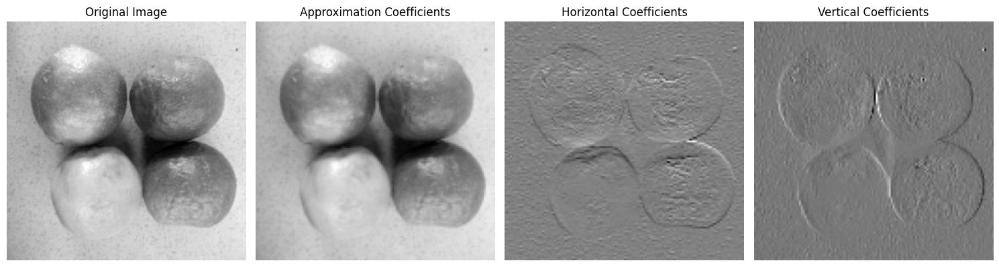

In [ ]:
wavelet_transform(sample_image_path)

## Inspect Directory Structure

In [ ]:
def print_directory_structure(base_dir):
    for root, dirs, files in os.walk(base_dir):
        level = root.replace(base_dir, '').count(os.sep)
        indent = ' ' * 4 * (level)
        print(f"{indent}{os.path.basename(root)}/")
        subindent = ' ' * 4 * (level + 1)
        for f in files:
            print(f"{subindent}{f}")

print("Dataset Directory Structure:")
print_directory_structure(base_dir)

Streaming output truncated to the last 5000 lines.
            IMG_20190822_081043.jpg
            IMG_20190822_080748_1.jpg
            IMG_20190822_080853.jpg
            IMG_20190822_080703_1.jpg
            IMG_20190822_081132.jpg
            IMG_20190824_180028.jpg
            IMG_20190829_072528.jpg
            IMG_20190822_081047.jpg
            IMG_20190822_081155_1.jpg
            IMG_20190824_180214.jpg
            IMG_20190822_080305.jpg
            IMG_20190822_081342_1.jpg
            IMG_20190829_072458_1.jpg
            IMG_20190822_081000_1.jpg
            IMG_20190824_180155.jpg
            IMG_20190822_080651.jpg
            IMG_20190824_181523_1.jpg
            IMG_20190822_080929_1.jpg
            IMG_20190824_180103.jpg
            IMG_20190824_180144.jpg
            IMG_20190822_080202.jpg
            IMG_20190822_081353.jpg
            IMG_20190824_181613.jpg
            IMG_20190822_080828.jpg
            IMG_20190822_080643_1.jpg
            IMG_20190822_080214

## Class Distribution

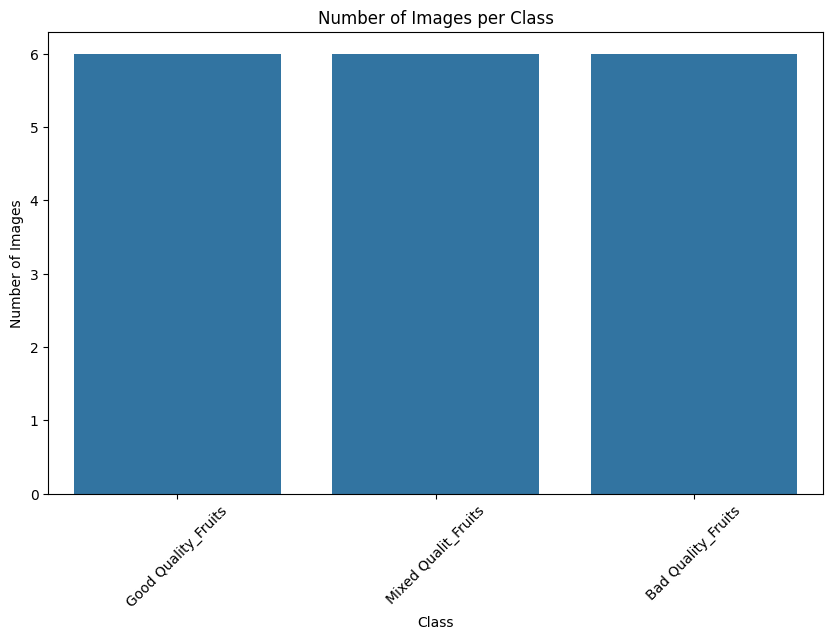

In [ ]:
class_counts = {}
for class_dir in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_dir)
    if os.path.isdir(class_path):
        class_counts[class_dir] = len(os.listdir(class_path))


plt.figure(figsize=(10, 6))
sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()))
plt.title('Number of Images per Class')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.xticks(rotation=45)
plt.show()

## Sample Images per Class

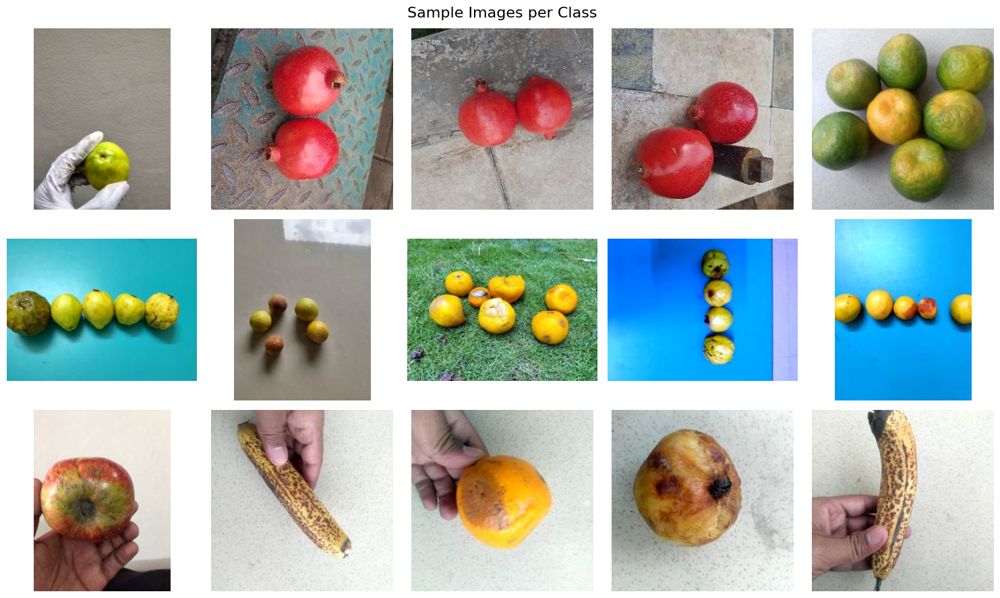

In [ ]:
import random

import os
import random
import matplotlib.pyplot as plt
from PIL import Image

def display_sample_images(base_dir, classes, samples=5):
    """
    Display sample images from each class, handling nested directories.

    Parameters:
    - base_dir (str): The base directory containing class subdirectories.
    - classes (list): List of class names.
    - samples (int): Number of samples to display per class.
    """
    plt.figure(figsize=(samples * 3, len(classes) * 3))
    for i, class_name in enumerate(classes):
        # Initialize list to hold image paths
        img_paths = []
        class_path = os.path.join(base_dir, class_name)

        # Walk through the class directory
        for root, _, files in os.walk(class_path):
            for file in files:
                if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                    img_paths.append(os.path.join(root, file))

        if not img_paths:
            print(f"No images found for class: {class_name}")
            continue

        # Sample images
        sampled_images = random.sample(img_paths, min(samples, len(img_paths)))

        for j, img_path in enumerate(sampled_images):
            try:
                img = Image.open(img_path)
                plt_idx = i * samples + j + 1
                plt.subplot(len(classes), samples, plt_idx)
                plt.imshow(img)
                plt.axis('off')
                if j == 0:
                    plt.ylabel(class_name, size='large')
            except Exception as e:
                print(f"Error opening image {img_path}: {e}")

    plt.suptitle('Sample Images per Class', fontsize=16)
    plt.tight_layout()
    plt.show()


classes = list(class_counts.keys())
display_sample_images(train_dir, classes, samples=5)


## Image Size Distribution

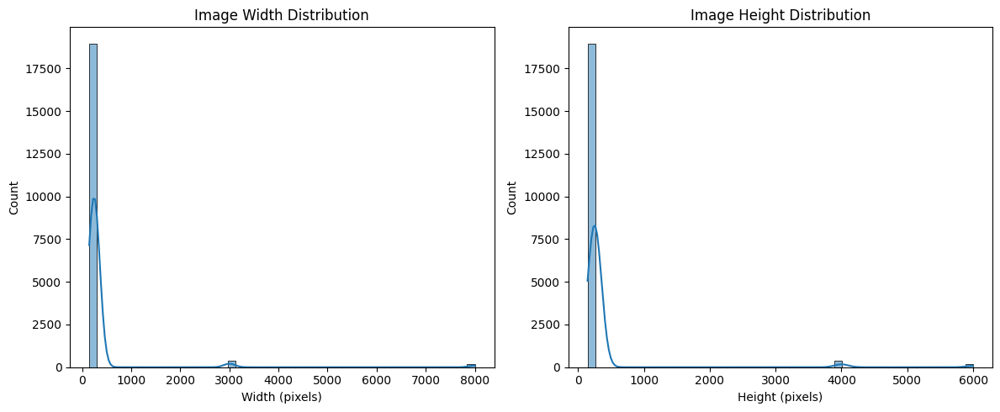

In [ ]:
image_sizes = []
for class_dir in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_dir)
    if os.path.isdir(class_path):
        for root, _, files in os.walk(class_path):
            for img_name in files:
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                    img_path = os.path.join(root, img_name)
                    try:
                        with Image.open(img_path) as img:
                            image_sizes.append(img.size)
                    except:
                        print(f"Cannot open image: {img_path}")

if image_sizes:
    image_sizes = np.array(image_sizes)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.histplot(image_sizes[:, 0], bins=50, kde=True)
    plt.title('Image Width Distribution')
    plt.xlabel('Width (pixels)')

    plt.subplot(1, 2, 2)
    sns.histplot(image_sizes[:, 1], bins=50, kde=True)
    plt.title('Image Height Distribution')
    plt.xlabel('Height (pixels)')

    plt.tight_layout()
    plt.show()
else:
    print("No image sizes to plot.")

## Data Augmentation Visualization

Found 19526 images belonging to 3 classes.


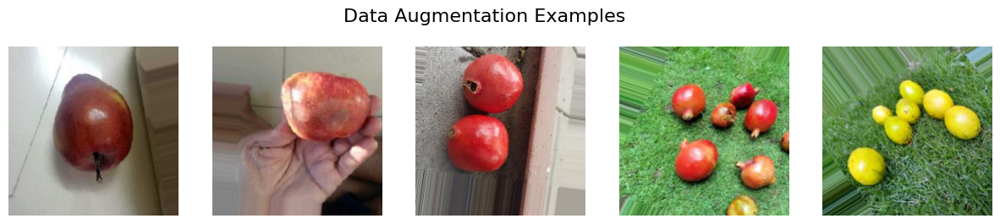

In [ ]:
aug_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

augmented_images, _ = next(aug_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=5,
    class_mode='categorical',
    shuffle=True
))

plt.figure(figsize=(15, 3))
for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.imshow(augmented_images[i])
    plt.axis('off')
plt.suptitle('Data Augmentation Examples', fontsize=16)
plt.show()


### Data generators for training and validation
20% of data for validation

In [ ]:
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

ResNet50 requires 224x224 input size images so we will adjust image generator for same target size

In [ ]:
train_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training'
)

Found 15623 images belonging to 3 classes.


In [ ]:
val_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)

Found 3903 images belonging to 3 classes.


we will load the ResNet50 model, excluding the top layers

In [ ]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

Freeze the base model

In [ ]:
for layer in base_model.layers:
    layer.trainable = False

Add new layers on top of the base model

In [ ]:
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Pooling layer
x = Dropout(0.5)(x)  # Dropout for regularization
x = Dense(128, activation='relu')(x)  # Dense layer
predictions = Dense(len(train_generator.class_indices), activation='softmax')(x)  # Output layer

# Model Creation

In [ ]:
modelResnet = Model(inputs=base_model.input, outputs=predictions)

In [ ]:
modelResnet.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
modelResnet.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 23,850,371 (90.98 MB)

 Trainable params: 262,659 (1.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

Callbacks: EarlyStopping and ModelCheckpoint

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

# training the model

In [ ]:
historyResnet = modelResnet.fit(
    train_generator,
    epochs=25,
    validation_data=val_generator,
    # callbacks=[early_stopping, checkpoint]
)

Epoch 1/25


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


489/489 ━━━━━━━━━━━━━━━━━━━━ 247s 457ms/step - accuracy: 0.5739 - loss: 0.8784 - val_accuracy: 0.5055 - val_loss: 0.9295
Epoch 2/25
489/489 ━━━━━━━━━━━━━━━━━━━━ 193s 380ms/step - accuracy: 0.6217 - loss: 0.7407 - val_accuracy: 0.4189 - val_loss: 1.2604
Epoch 3/25
489/489 ━━━━━━━━━━━━━━━━━━━━ 146s 296ms/step - accuracy: 0.6533 - loss: 0.7104 - val_accuracy: 0.4906 - val_loss: 0.9850
Epoch 4/25
489/489 ━━━━━━━━━━━━━━━━━━━━ 201s 292ms/step - accuracy: 0.6609 - loss: 0.6876 - val_accuracy: 0.5122 - val_loss: 1.0359
Epoch 5/25
489/489 ━━━━━━━━━━━━━━━━━━━━ 137s 276ms/step - accuracy: 0.6675 - loss: 0.6749 - val_accuracy: 0.4084 - val_loss: 1.2670
Epoch 6/25
489/489 ━━━━━━━━━━━━━━━━━━━━ 146s 287ms/step - accuracy: 0.6840 - loss: 0.6578 - val_accuracy: 0.5311 - val_loss: 1.0724
Epoch 7/25
489/489 ━━━━━━━━━━━━━━━━━━━━ 139s 280ms/step - accuracy: 0.6874 - loss: 0.6483 - val_accuracy: 0.5298 - val_loss: 1.0557
Epoch 8/25
489/489 ━━━━━━━━━━━━━━━━━━━━ 134s 265ms/step - accuracy: 0.6861 - loss: 0.65

In [ ]:
# Save the trained model to an HDF5 file
modelResnet.save('resnet_fruit_classification_model.h5')

## Plot training and validation accuracy and loss

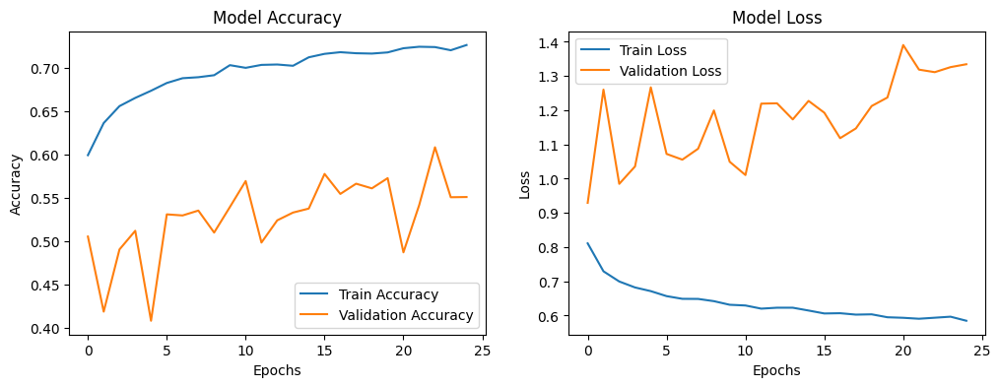

In [ ]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(historyResnet.history['accuracy'], label='Train Accuracy')
plt.plot(historyResnet.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(historyResnet.history['loss'], label='Train Loss')
plt.plot(historyResnet.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Predict the classes

In [ ]:
val_generator.reset()
predictions = modelResnet.predict(val_generator, verbose=1)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = val_generator.classes
class_labels = list(val_generator.class_indices.keys())

122/122 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step


In [ ]:
# Evaluate the model on the validation set
val_loss, val_accuracy = modelResnet.evaluate(val_generator)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")
print(f"Validation Loss: {val_loss:.4f}")

122/122 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - accuracy: 0.5307 - loss: 1.3615
Validation Accuracy: 55.11%
Validation Loss: 1.3345


## Compute and plot confusion matrix

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
cm = confusion_matrix(true_classes, predicted_classes)

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion Matrix',
                          cmap=plt.cm.Blues):
    plt.figure(figsize=(10, 8))
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized Confusion Matrix")
    else:
        print("Confusion Matrix, without normalization")

    sns.heatmap(cm, annot=True, fmt='.2f' if normalize else 'd',
                cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()

## non-normalized confusion matrix

Confusion Matrix, without normalization


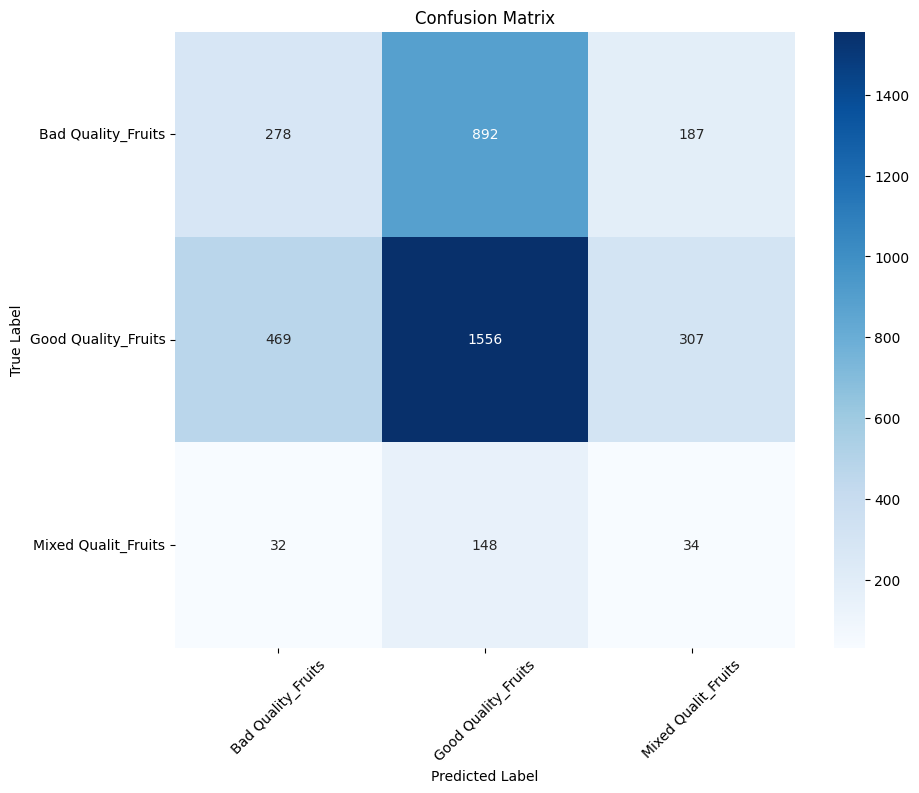

In [ ]:
plot_confusion_matrix(cm, classes=class_labels, title='Confusion Matrix')

## normalized confusion matrix

Normalized Confusion Matrix


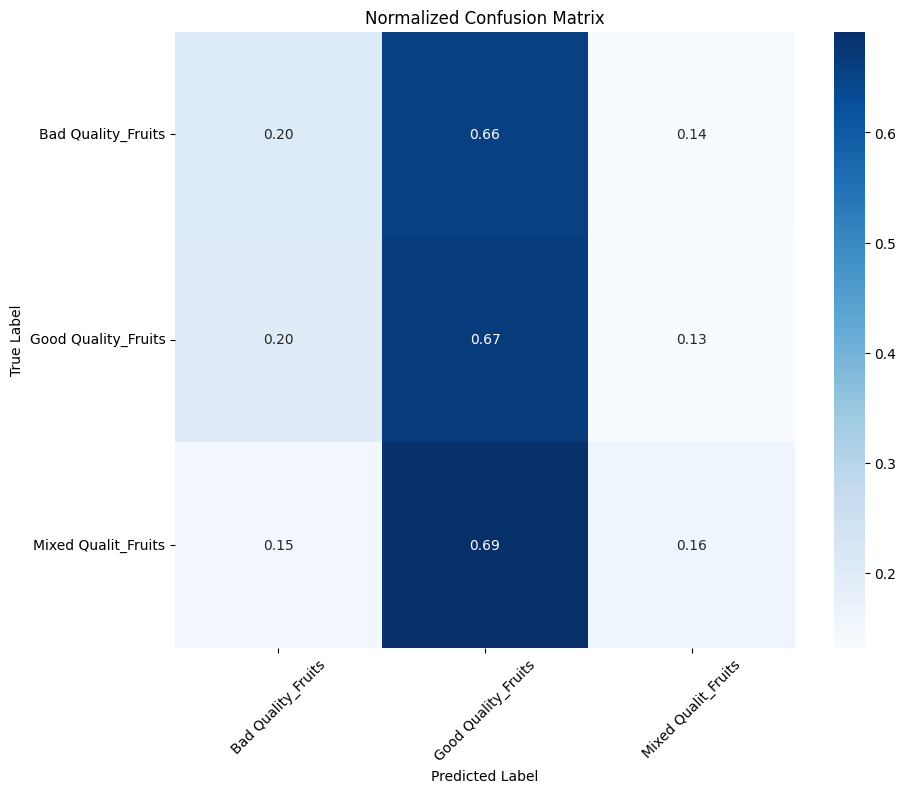

In [ ]:
plot_confusion_matrix(cm, classes=class_labels, normalize=True, title='Normalized Confusion Matrix')

## Classification Report


In [ ]:
class_labels = ['.ipynb_checkpoints', 'Bad Quality_Fruits', 'Good Quality_Fruits']

In [ ]:
report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print( "ResNet Classification Report:\n", report)


ResNet Classification Report:
                      precision    recall  f1-score   support

  Bad Quality_Fruits       0.70      0.74      0.72      1357
 Good Quality_Fruits       0.82      0.81      0.81      2332
Mixed Quality_Fruits       1.00      0.66      0.80       214

            accuracy                           0.78      3903
           macro avg       0.84      0.74      0.78      3903
        weighted avg       0.79      0.78      0.78      3903



## Visualizing Misclassified Images

In [ ]:
misclassified_indices = np.where(predicted_classes != true_classes)[0]

## Number of misclassified samples to display

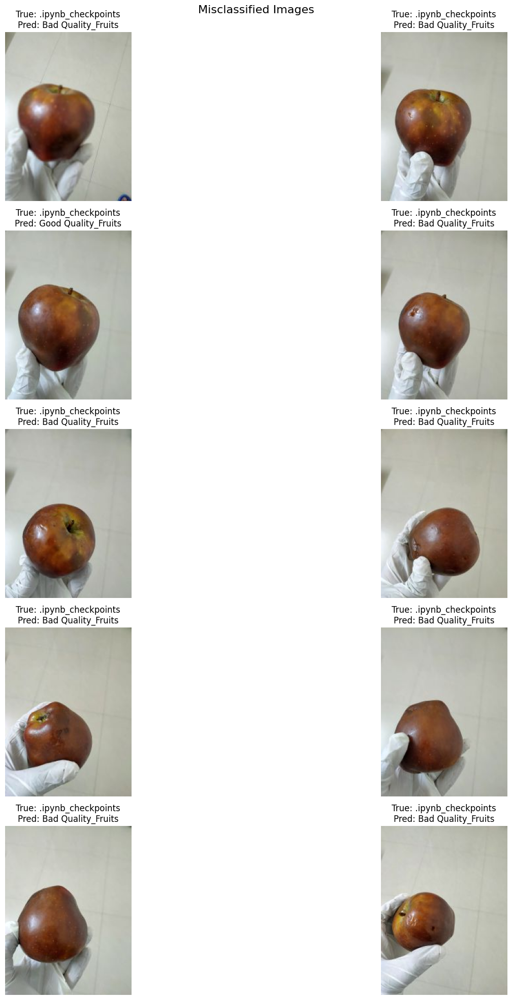

In [ ]:
num_display = 10

plt.figure(figsize=(20, 20))
for i, idx in enumerate(misclassified_indices[:num_display]):
    img_path = val_generator.filepaths[idx]
    img = Image.open(img_path)
    plt.subplot(5, 2, i+1)
    plt.imshow(img)
    plt.title(f"True: {class_labels[true_classes[idx]]}\nPred: {class_labels[predicted_classes[idx]]}")
    plt.axis('off')
plt.suptitle('Misclassified Images', fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model

def get_grad_cam(model, img_array, class_index, layer_name):
    import tensorflow as tf
    from tensorflow.keras.models import Model
    from tensorflow.keras import backend as K

    if len(img_array.shape) == 5:
        img_array = img_array.reshape((img_array.shape[1:]))

    grad_model = Model(
        inputs=[model.inputs],
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        inputs = tf.cast(img_array, tf.float32)
        tape.watch(inputs)
        conv_outputs, predictions = grad_model(inputs)
        loss = predictions[:, class_index]

    output = conv_outputs[0]
    grads = tape.gradient(loss, conv_outputs)[0]

    weights = tf.reduce_mean(grads, axis=(0, 1))
    cam = tf.reduce_sum(tf.multiply(weights, output), axis=-1)

    heatmap = tf.maximum(cam, 0) / tf.reduce_max(cam)
    heatmap = heatmap.numpy()
    return heatmap


def display_grad_cam(img_array, heatmap, alpha=0.4):
    import cv2
    import matplotlib.pyplot as plt
    import numpy as np

    img = img_array[0] if img_array.shape[0] == 1 else img_array

    heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap_colored = plt.cm.jet(heatmap_resized)[..., :3]

    combined = heatmap_colored * alpha + img
    combined = np.clip(combined, 0, 1)
    plt.imshow(combined)
    plt.axis('off')
    plt.show()


Shape of sample_img_array before get_grad_cam: (1, 224, 224, 3)


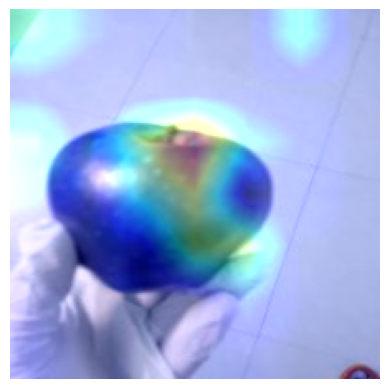

In [ ]:
misclassified_sample_index = misclassified_indices[0]
sample_img_path = val_generator.filepaths[misclassified_sample_index]
sample_img = cv2.imread(sample_img_path)
sample_img_resized = cv2.resize(sample_img, (224, 224))

sample_img_array = np.expand_dims(sample_img_resized / 255.0, axis=0)

true_class_index = true_classes[misclassified_sample_index]

layer_name = 'conv5_block3_out'
print("Shape of sample_img_array before get_grad_cam:", sample_img_array.shape)
heatmap = get_grad_cam(modelResnet, sample_img_array, true_class_index, layer_name)
display_grad_cam(sample_img_array[0], heatmap)



# Explainability

In [ ]:
from tensorflow.keras.models import load_model

modelResnet = load_model('resnet_fruit_classification_model.h5')


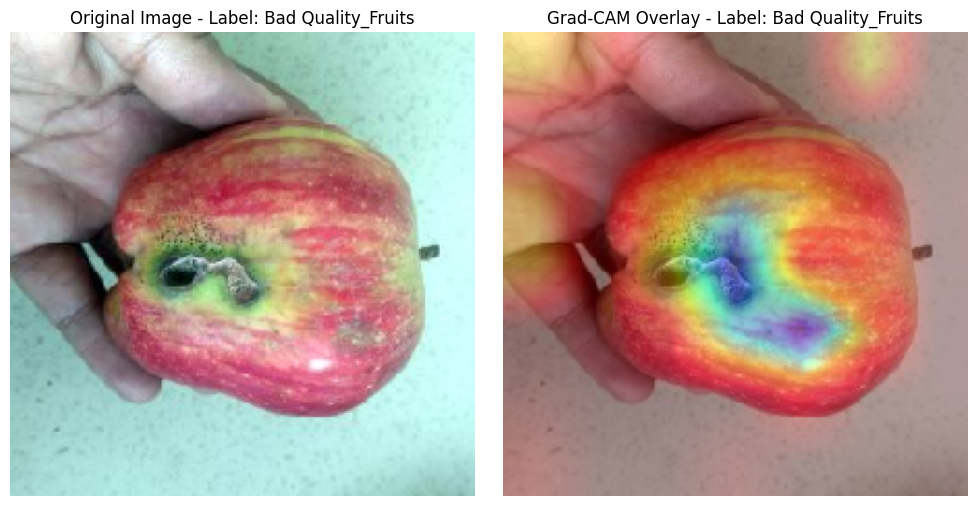

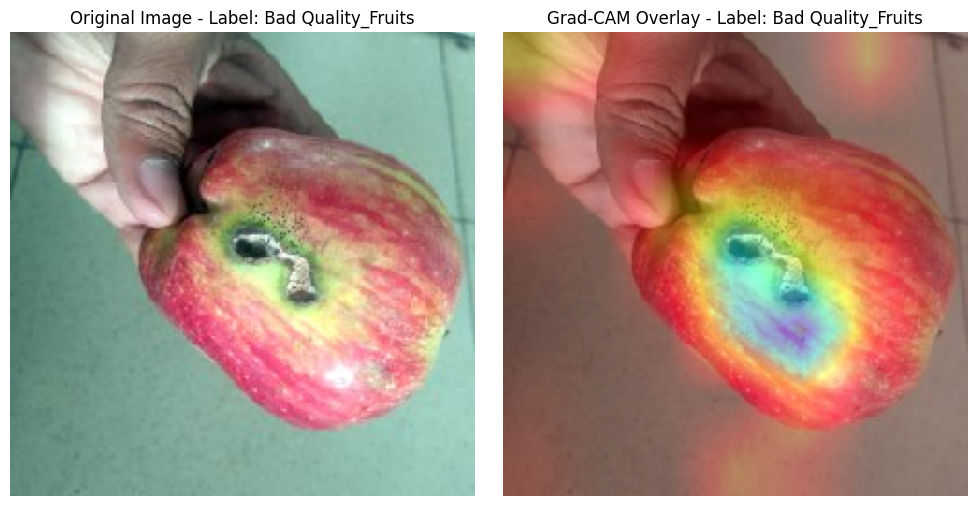

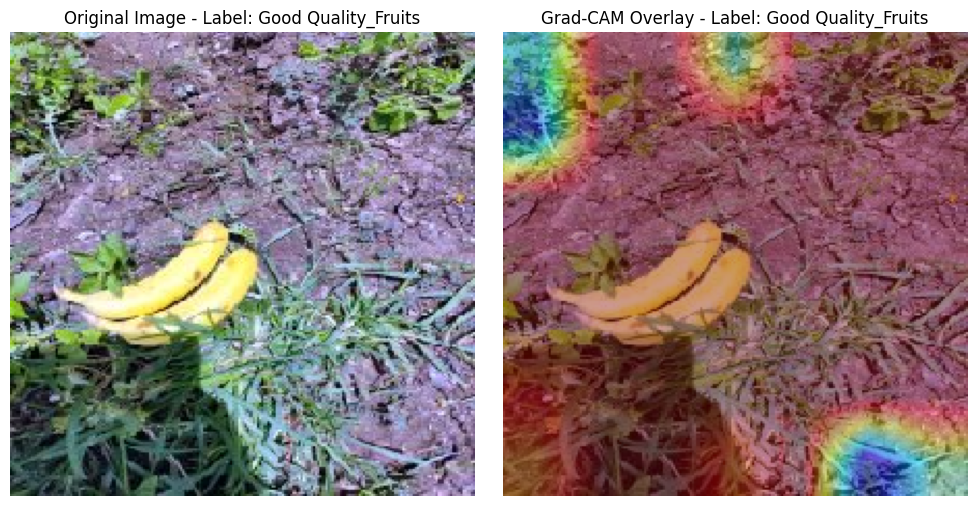

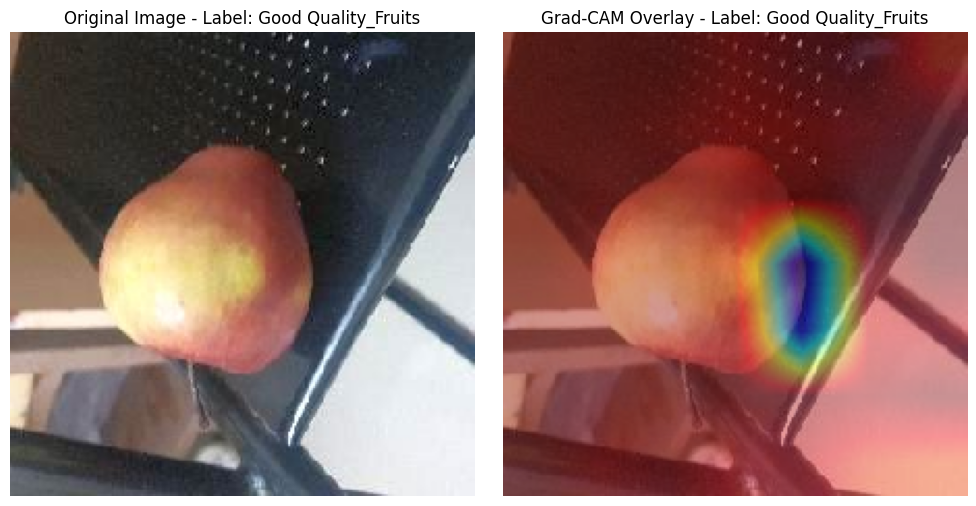

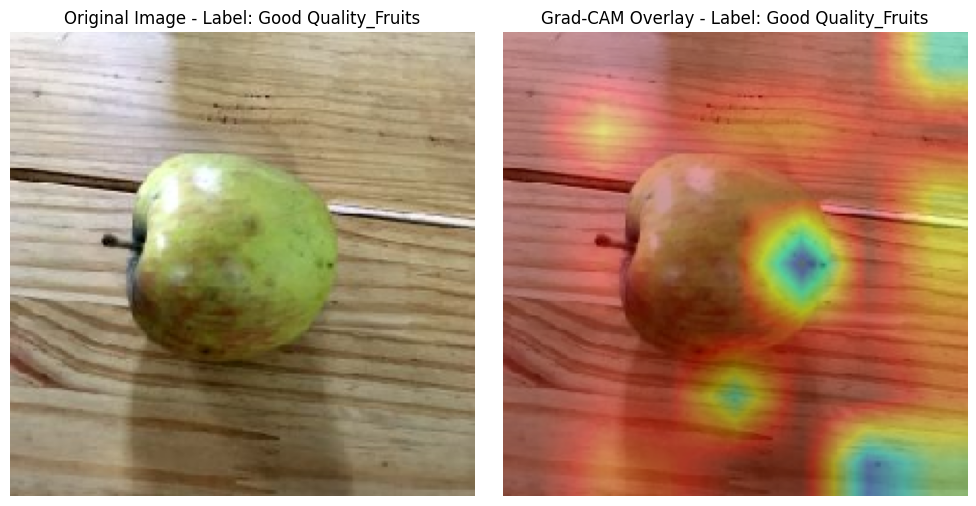

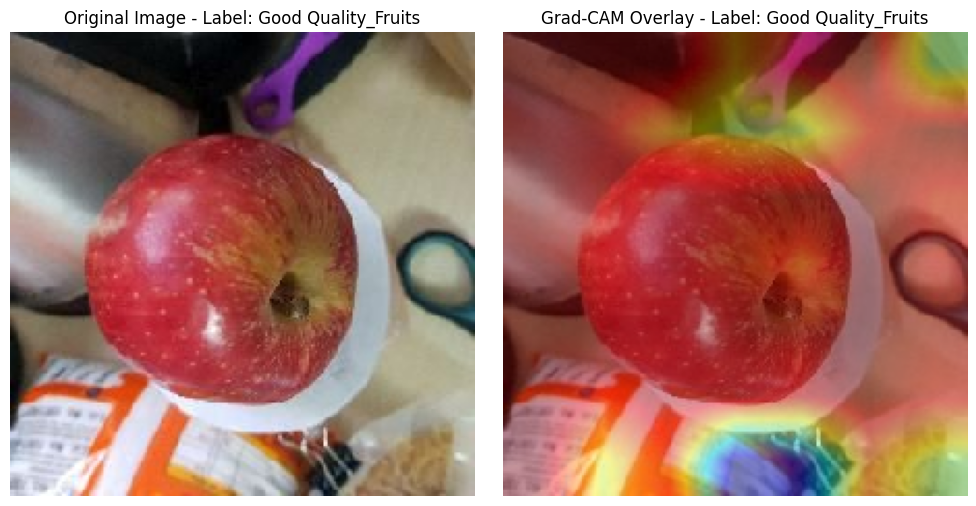

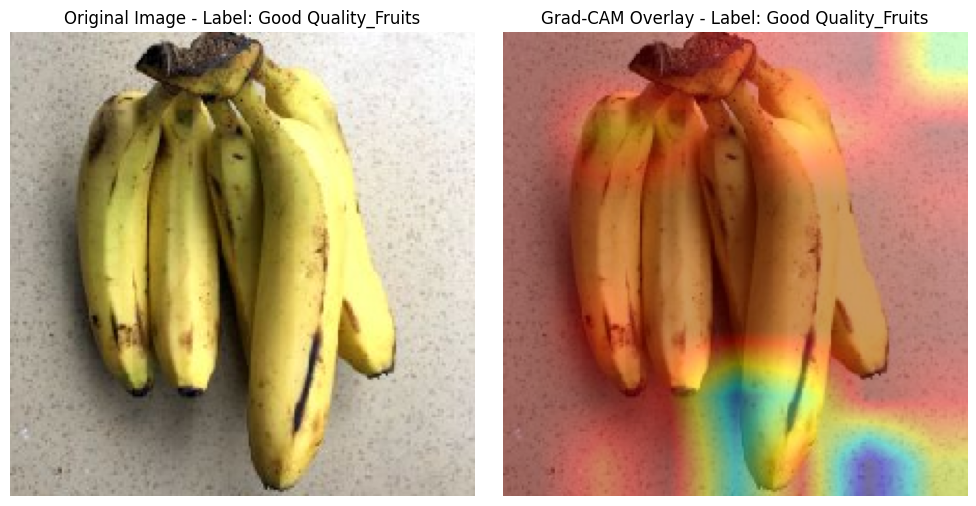

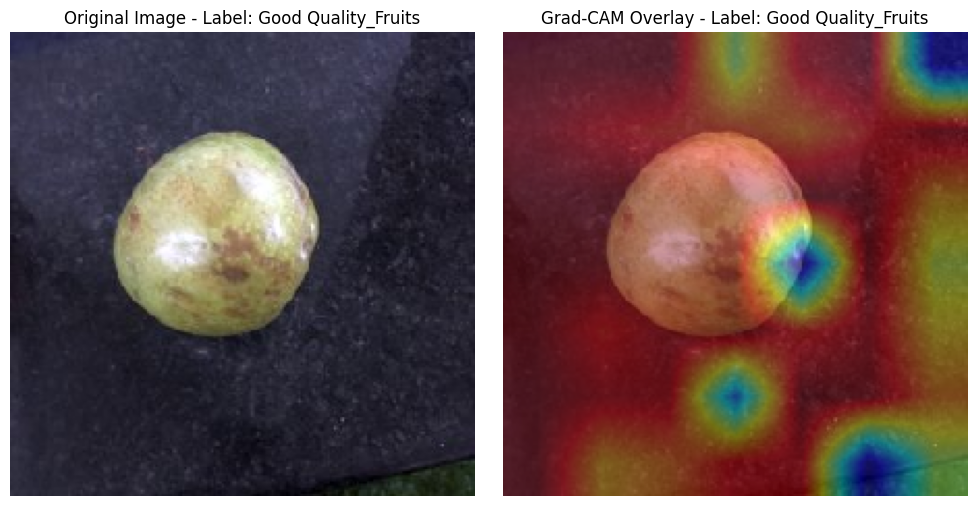

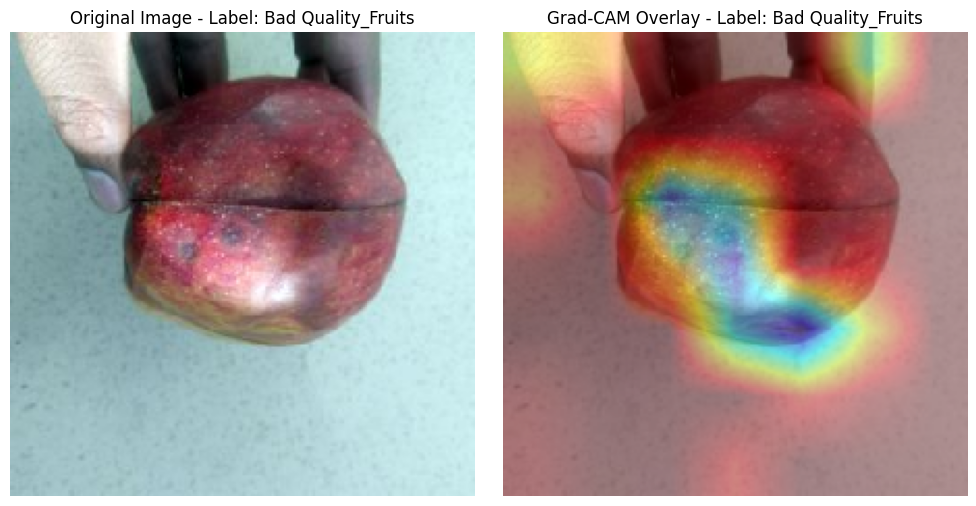

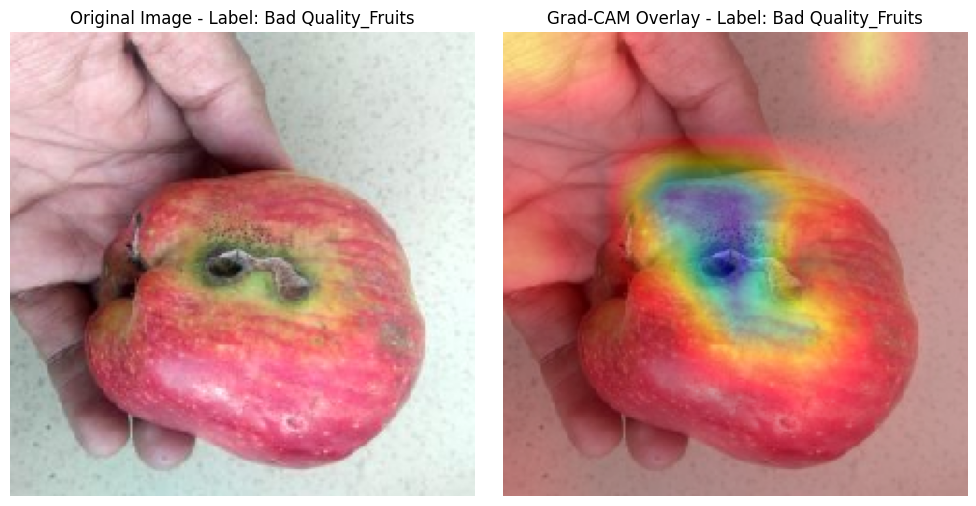

In [ ]:

images, labels = next(val_generator)
class_names = {v: k for k, v in train_generator.class_indices.items()}

random_indices = np.random.choice(range(len(images)), size=10, replace=False)

for idx in random_indices:
    sample_image = images[idx]
    sample_label_index = np.argmax(labels[idx])
    sample_label_name = class_names[sample_label_index]

    img_array = np.expand_dims(sample_image, axis=0)

    heatmap = grad_cam(modelResnet, img_array, sample_label_index, 'conv5_block3_out')

    # Resize and overlay heatmap on the image+
    heatmap_resized = cv2.resize(heatmap, (sample_image.shape[1], sample_image.shape[0]))
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
    overlayed_image = cv2.addWeighted(np.uint8(sample_image * 255), 0.6, heatmap_colored, 0.4, 0)

    # Display side-by-side
    plt.figure(figsize=(10, 5))

    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(sample_image)
    plt.axis('off')
    plt.title(f"Original Image - Label: {sample_label_name}")

    # Grad-CAM overlay
    plt.subplot(1, 2, 2)
    plt.imshow(overlayed_image)
    plt.axis('off')
    plt.title(f"Grad-CAM Overlay - Label: {sample_label_name}")

    plt.tight_layout()
    plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

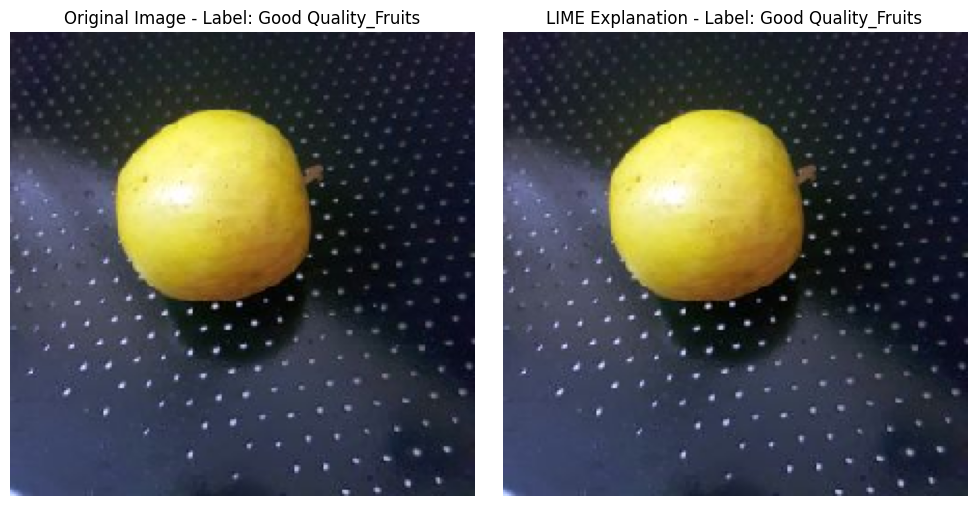

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

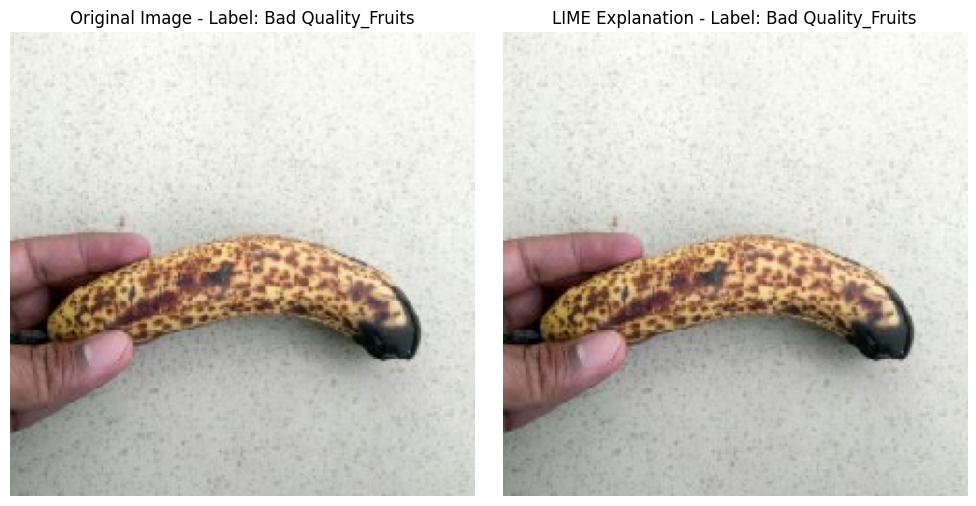

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━

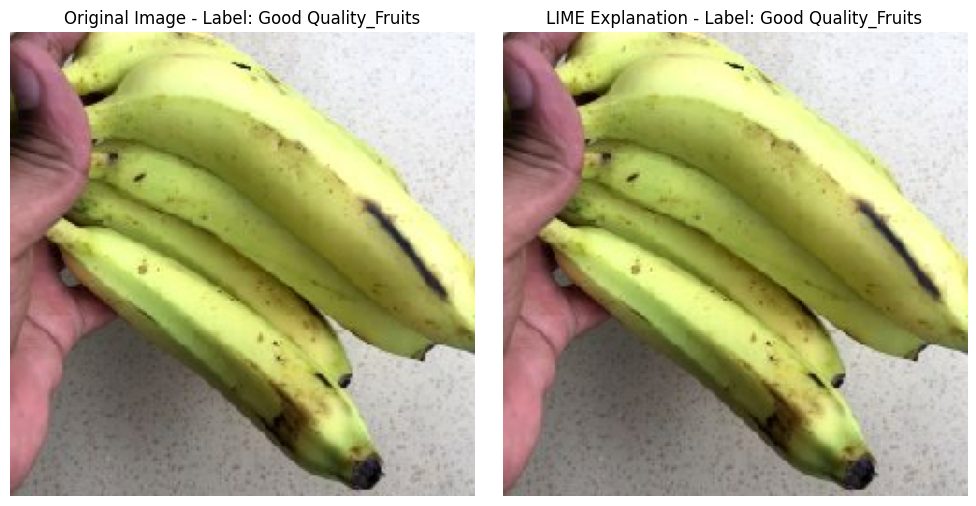

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━

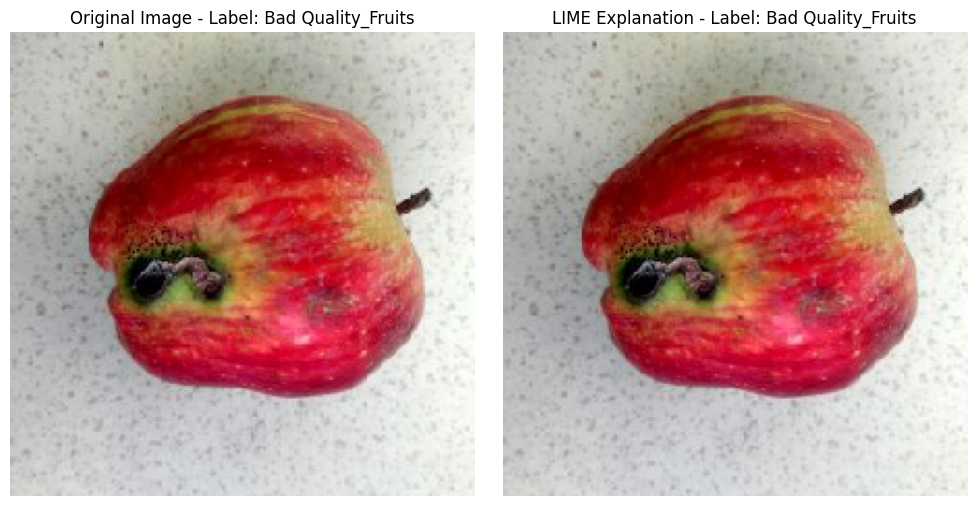

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━

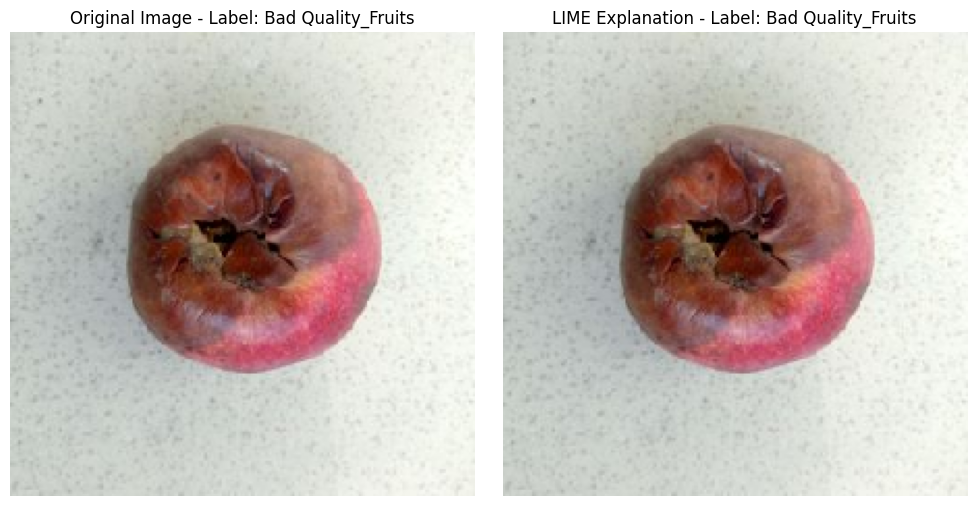

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━

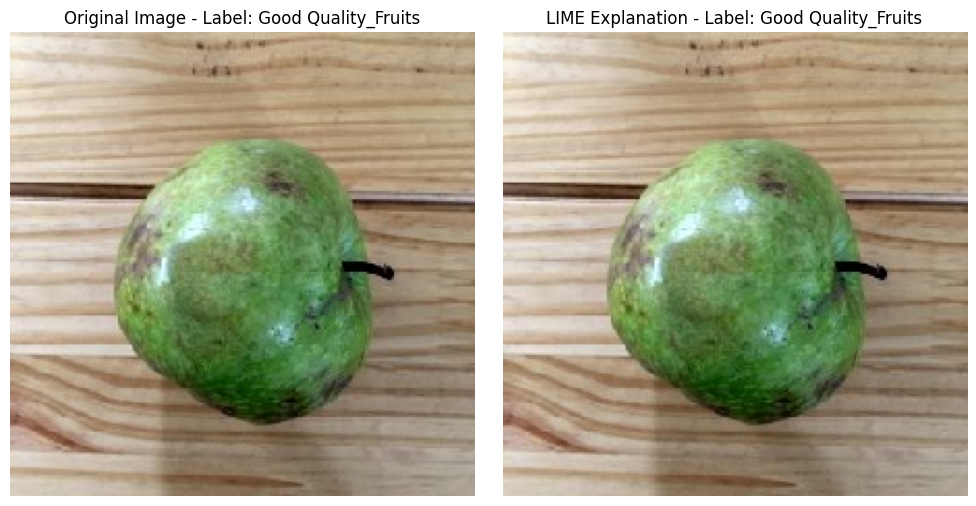

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

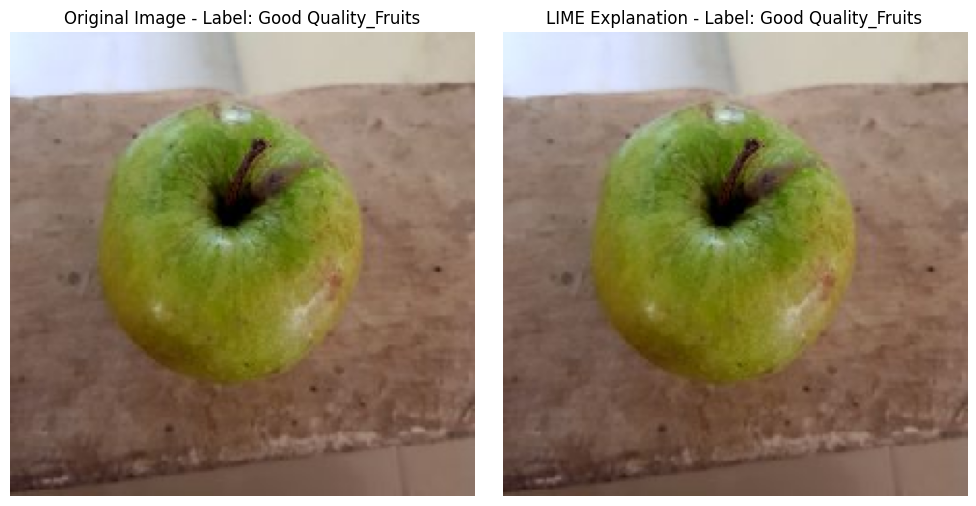

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━

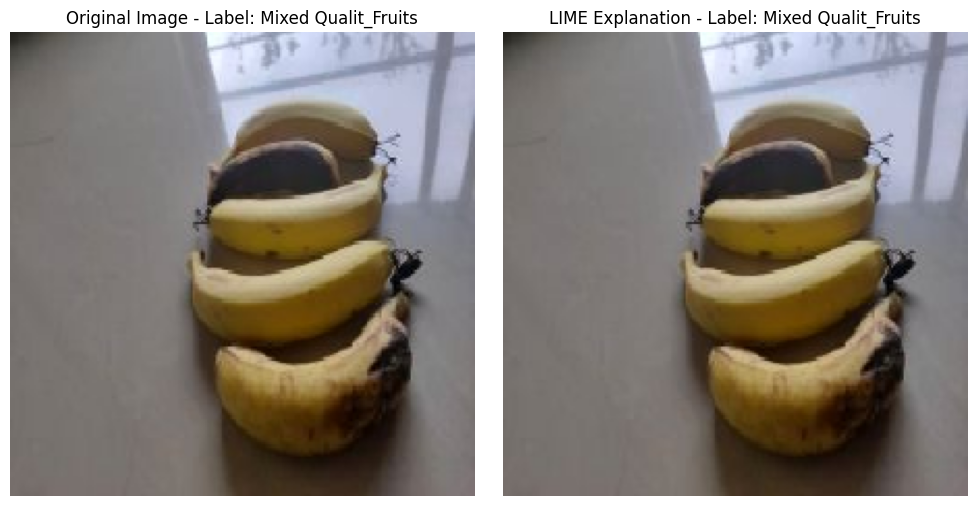

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━

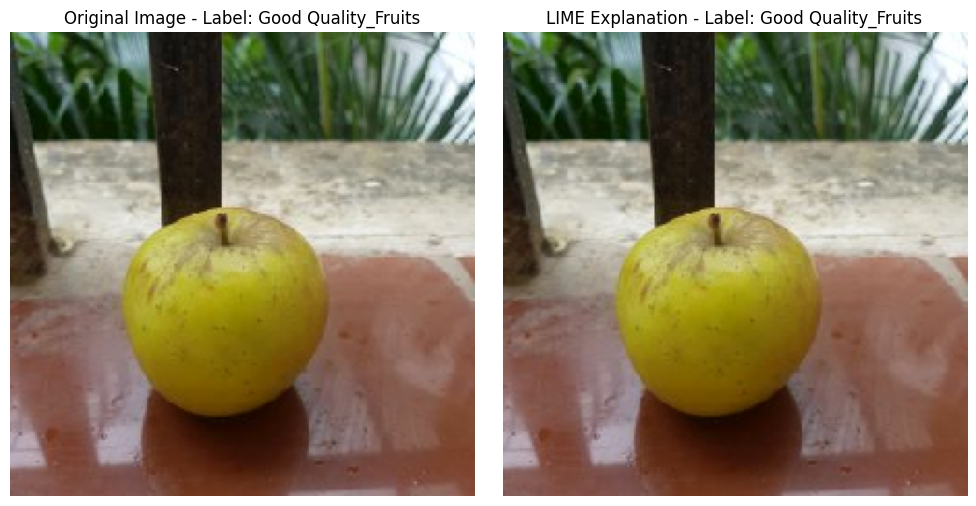

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━

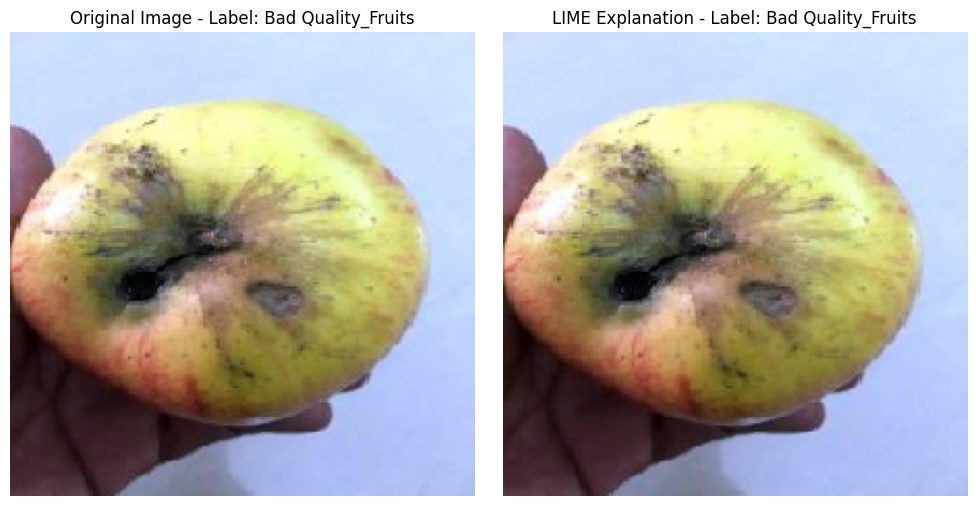

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from lime import lime_image
from sklearn.preprocessing import LabelEncoder

class_names = {v: k for k, v in train_generator.class_indices.items()}

images, labels = next(val_generator)
random_indices = np.random.choice(range(len(images)), size=10, replace=False)

explainer = lime_image.LimeImageExplainer()

for idx in random_indices:
    sample_image = images[idx]
    sample_label_index = np.argmax(labels[idx])
    sample_label_name = class_names[sample_label_index]

    image_for_lime = np.expand_dims(sample_image, axis=0)

    def predict_fn(images):
        images = np.array(images)
        return modelResnet.predict(images)

    explanation = explainer.explain_instance(
        sample_image.astype('double'),
        predict_fn,
        top_labels=5,
        hide_color=0,
        num_samples=1000
    )

    temp, mask = explanation.get_image_and_mask(
        sample_label_index,
        positive_only=True,
        hide_rest=False,
        num_features=10,
        min_weight=0.01
    )

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(sample_image)
    plt.axis('off')
    plt.title(f"Original Image - Label: {sample_label_name}")

    plt.subplot(1, 2, 2)
    plt.imshow(temp)
    plt.axis('off')
    plt.title(f"LIME Explanation - Label: {sample_label_name}")

    plt.tight_layout()
    plt.show()


# EfficientNet

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import img_to_array
import albumentations as A
from albumentations.core.composition import OneOf

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [ ]:
def preprocess_image(img_path, target_size=(128, 128)):  # Updated target size
    # Read the image
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Apply CLAHE for local contrast enhancement
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l = clahe.apply(l)
    lab = cv2.merge((l, a, b))
    image = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

    # Image sharpening
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    image = cv2.filter2D(image, -1, kernel)

    # Resize image to a smaller target size for faster processing
    image = cv2.resize(image, target_size)

    # Convert image to array format for Keras
    return img_to_array(image)


In [ ]:
class PreprocessedImageDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, file_paths, labels, batch_size=32, augment=False, target_size=(128, 128)):
        self.file_paths = file_paths
        self.labels = labels
        self.batch_size = batch_size
        self.augment = augment
        self.target_size = target_size  # Target size for faster processing
        self.on_epoch_end()

    def __getitem__(self, index):
        # Fetch batch data
        indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]
        batch_files = [self.file_paths[i] for i in indices]
        batch_labels = np.array([self.labels[i] for i in indices])

        # One-hot encode the labels
        batch_labels = tf.keras.utils.to_categorical(batch_labels, num_classes=3)

        # Preprocess the images
        images = np.array([preprocess_image(file, target_size=self.target_size) for file in batch_files])

        if self.augment:
            aug = A.Compose([
                OneOf([
                    A.CoarseDropout(),
                    A.RandomBrightnessContrast()
                ], p=0.5),
                A.HorizontalFlip(p=0.5),
                A.RandomResizedCrop(self.target_size[0], self.target_size[1], scale=(0.8, 1.0), ratio=(0.9, 1.1))
            ])
            images = np.array([aug(image=image)['image'] for image in images])

        return images, batch_labels

In [ ]:
def build_modified_efficientnet(num_classes):
    base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

    # Custom layers after EfficientNet
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    x = Dense(256, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    x = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=x)

    # Unfreeze specific layers for fine-tuning
    for layer in base_model.layers[-20:]:
        layer.trainable = True

    return model

In [ ]:
train_dir = '/content/FruitsData'  # Path to your dataset directory

In [ ]:
datagen = ImageDataGenerator(
    rescale=1.0/255,
    validation_split=0.2,  # Use 20% of the data for validation
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

In [ ]:
train_data = datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),  # Smaller image size
    batch_size=32,
    class_mode='categorical',  # This will return one-hot encoded labels
    subset='training',
    shuffle=True
)

Found 15623 images belonging to 3 classes.


In [ ]:
val_data = datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',  # This will return one-hot encoded labels
    subset='validation',
    shuffle=True
)

Found 3903 images belonging to 3 classes.


In [ ]:
# Build the model
modelEfficientNet = build_modified_efficientnet(num_classes=len(train_data.class_indices))

# Compile the model
modelEfficientNet.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
modelEfficientNet.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 128, 128, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 128, 128, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 128, 128, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 128, 128, 3)    │              0 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 129, 129, 3)    │              0 │ rescaling_1[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 64, 64, 32)     │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 64, 64, 32)     │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 64, 64, 32)     │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 64, 64, 32)     │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 64, 64, 32)     │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 64, 64, 32)     │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 4,384,422 (16.73 MB)

 Trainable params: 4,339,327 (16.55 MB)

 Non-trainable params: 45,095 (176.16 KB)

In [ ]:
historyEfficientNet = modelEfficientNet.fit(
    train_data,
    validation_data=val_data,
    epochs=25
)

Epoch 1/25


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


489/489 ━━━━━━━━━━━━━━━━━━━━ 335s 521ms/step - accuracy: 0.6842 - loss: 0.8830 - val_accuracy: 0.6052 - val_loss: 1.0974
Epoch 2/25
489/489 ━━━━━━━━━━━━━━━━━━━━ 211s 379ms/step - accuracy: 0.9476 - loss: 0.1521 - val_accuracy: 0.6362 - val_loss: 2.2565
Epoch 3/25
489/489 ━━━━━━━━━━━━━━━━━━━━ 208s 410ms/step - accuracy: 0.9709 - loss: 0.0892 - val_accuracy: 0.6359 - val_loss: 2.1954
Epoch 4/25
489/489 ━━━━━━━━━━━━━━━━━━━━ 200s 401ms/step - accuracy: 0.9815 - loss: 0.0509 - val_accuracy: 0.6567 - val_loss: 2.2266
Epoch 5/25
489/489 ━━━━━━━━━━━━━━━━━━━━ 196s 392ms/step - accuracy: 0.9856 - loss: 0.0478 - val_accuracy: 0.6349 - val_loss: 2.2653
Epoch 6/25
489/489 ━━━━━━━━━━━━━━━━━━━━ 197s 397ms/step - accuracy: 0.9857 - loss: 0.0419 - val_accuracy: 0.6352 - val_loss: 2.9669
Epoch 7/25
489/489 ━━━━━━━━━━━━━━━━━━━━ 202s 400ms/step - accuracy: 0.9907 - loss: 0.0329 - val_accuracy: 0.6482 - val_loss: 3.1637
Epoch 8/25
489/489 ━━━━━━━━━━━━━━━━━━━━ 195s 397ms/step - accuracy: 0.9936 - loss: 0.02

In [ ]:
# Save the model
modelEfficientNet.save('efficientnet_fruit_quality_model.h5')

# Load the model
# loaded_model = tf.keras.models.load_model('fruit_quality_model.h5')


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
import pandas as pd
import tensorflow as tf


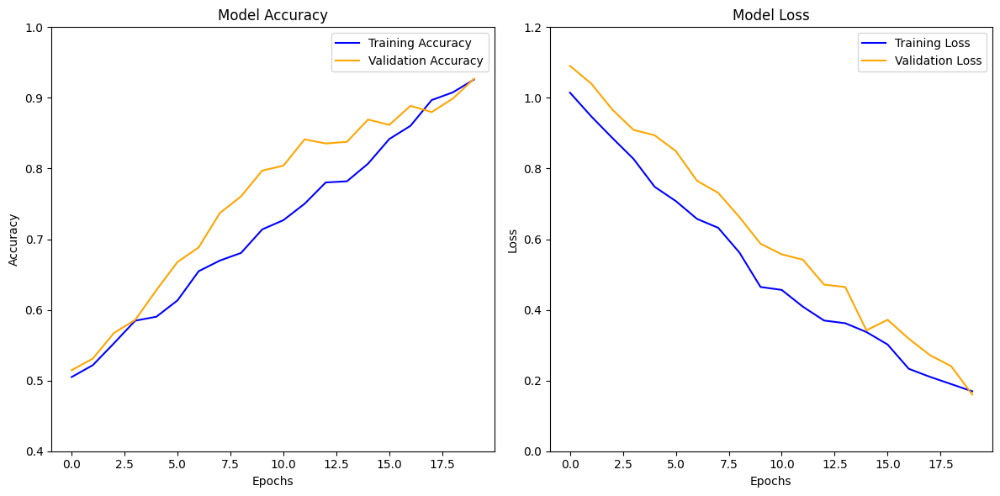

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(historyEfficientNet.history['accuracy'], label='Training Accuracy')
plt.plot(historyEfficientNet.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(historyEfficientNet.history['loss'], label='Training Loss')
plt.plot(historyEfficientNet.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


122/122 ━━━━━━━━━━━━━━━━━━━━ 29s 185ms/step


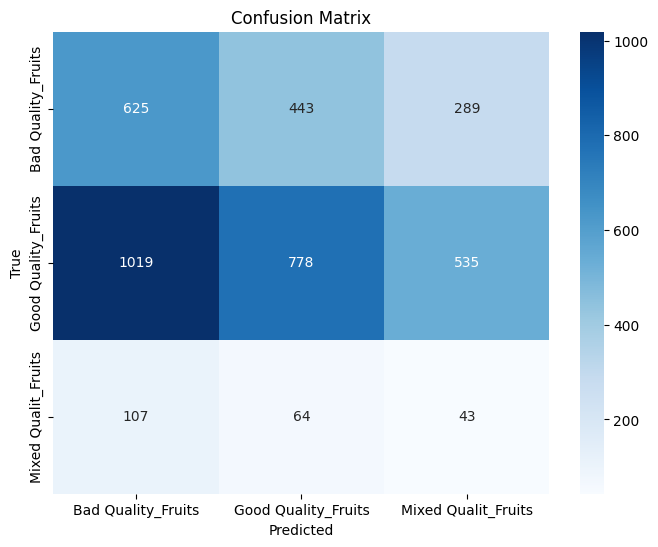

In [ ]:
# Get predictions on validation data
val_preds = modelEfficientNet.predict(val_data)
val_preds = np.argmax(val_preds, axis=1)  # Get class labels from probabilities

# Get true labels from validation data
val_labels = val_data.classes

# Compute confusion matrix
conf_matrix = confusion_matrix(val_labels, val_preds)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=val_data.class_indices.keys(), yticklabels=val_data.class_indices.keys())
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


In [ ]:
# Get classification report
class_report = classification_report(val_labels, val_preds, target_names=val_data.class_indices.keys())
print("EfficientNet Classification Report:\n", class_report)


EfficientNet Classification Report:
                      precision    recall  f1-score   support

  Bad Quality_Fruits       0.81      0.86      0.84      1357
 Good Quality_Fruits       0.90      0.88      0.89      2332
Mixed Quality_Fruits       1.00      0.79      0.89       214

            accuracy                           0.87      3903
           macro avg       0.90      0.85      0.87      3903
        weighted avg       0.87      0.87      0.87      3903



# Explainability

In [ ]:
from tensorflow.keras.models import load_model

modelEfficientNet = load_model('efficientnet_fruit_quality_model.h5')


1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


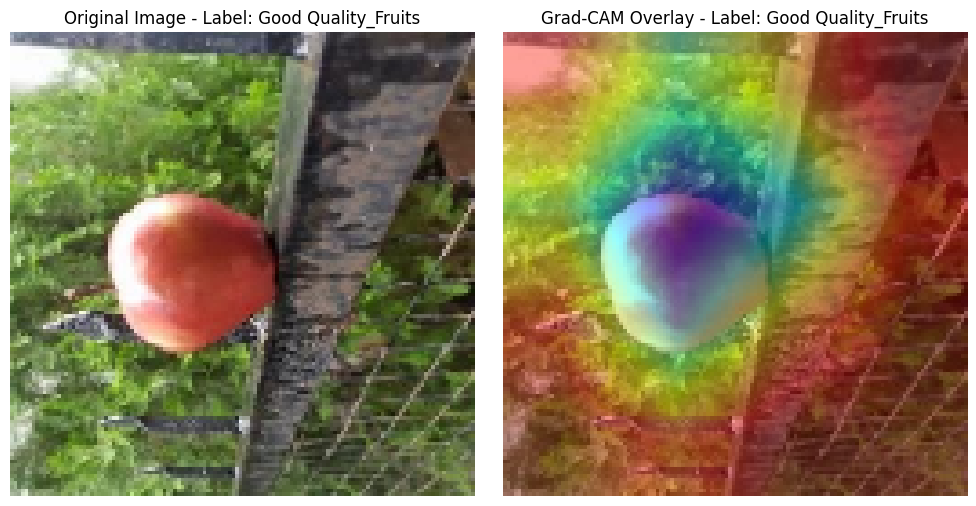

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


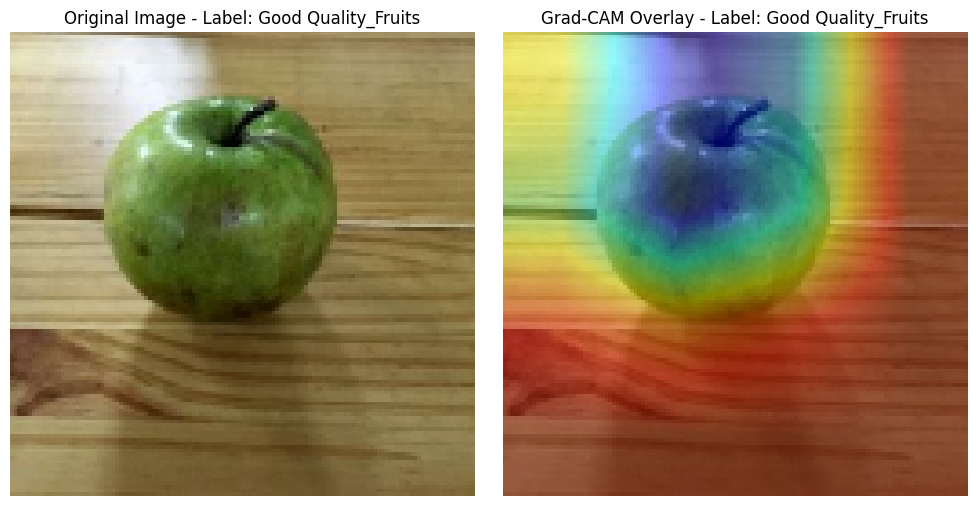

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


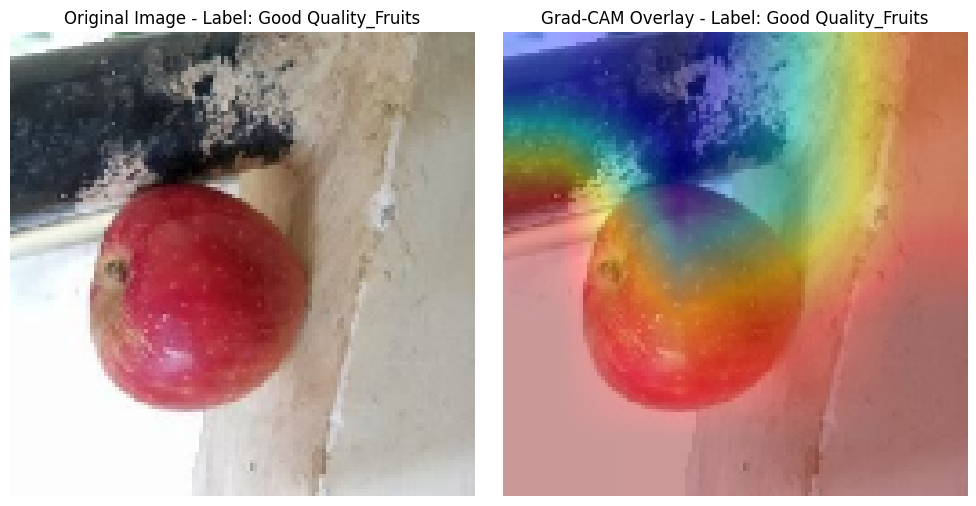

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


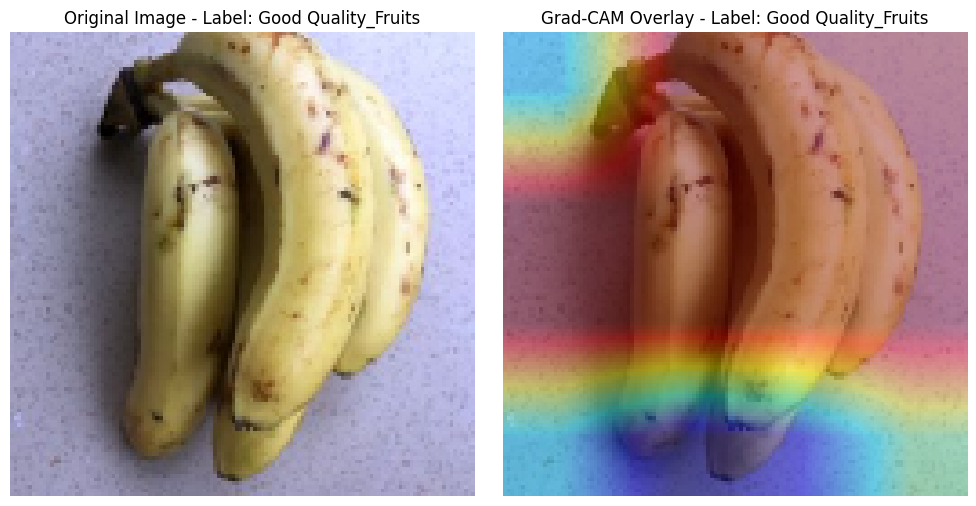

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


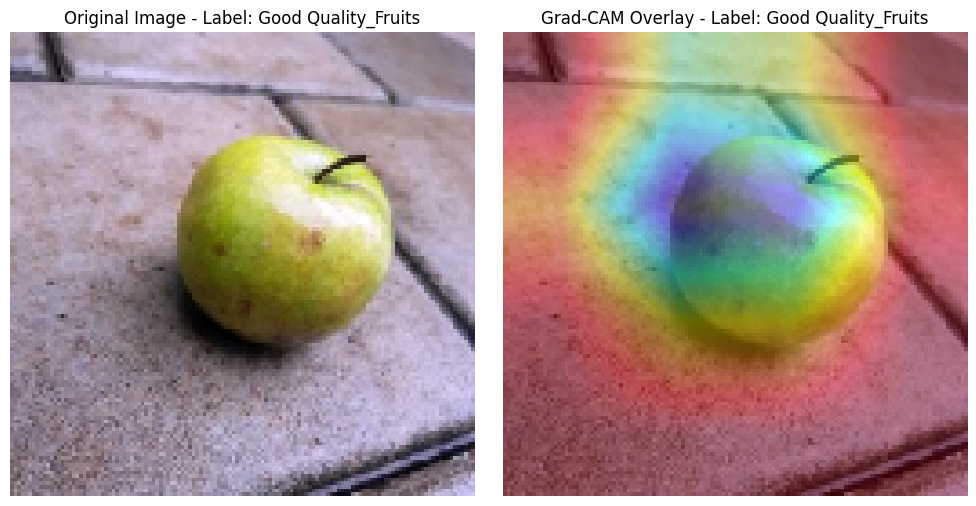

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


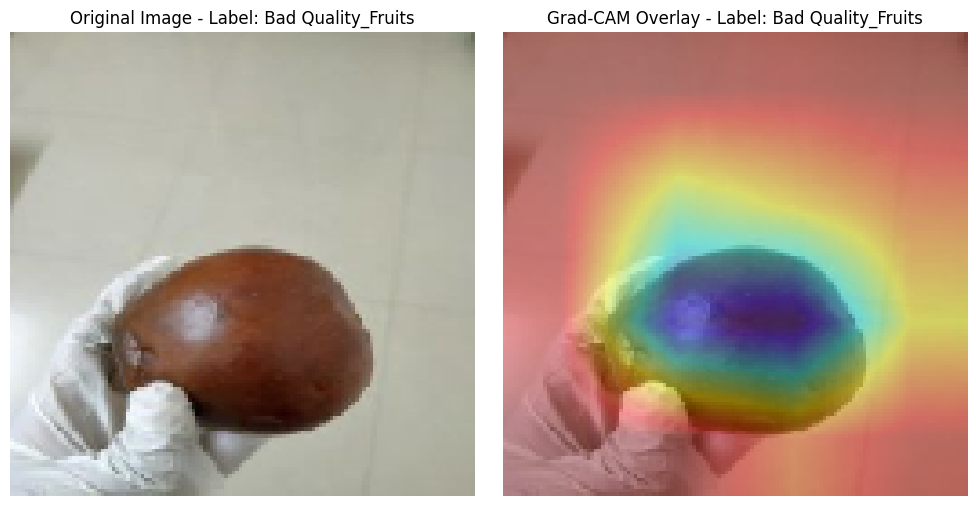

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


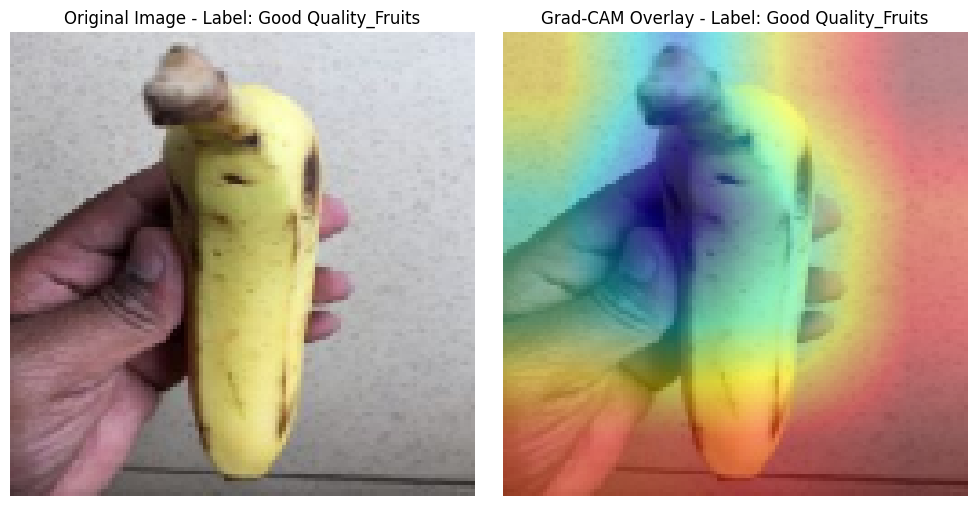

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


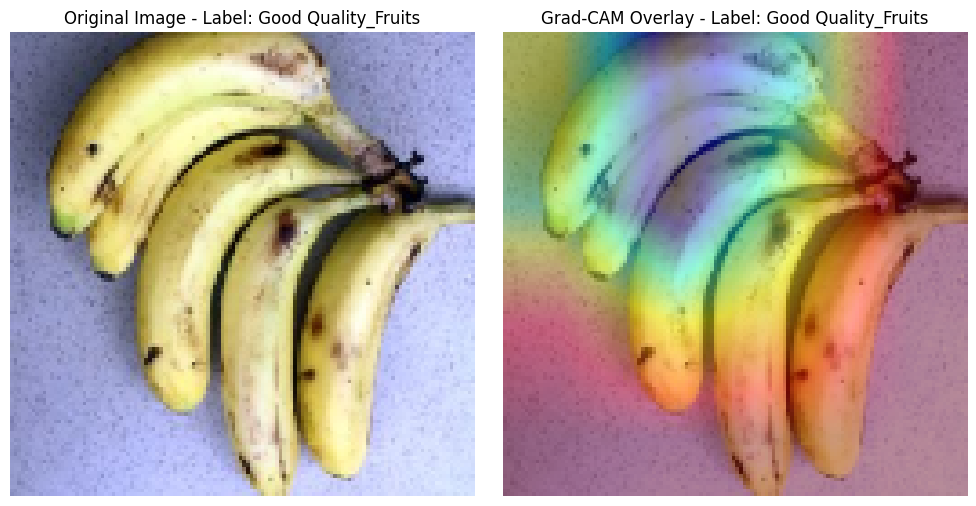

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


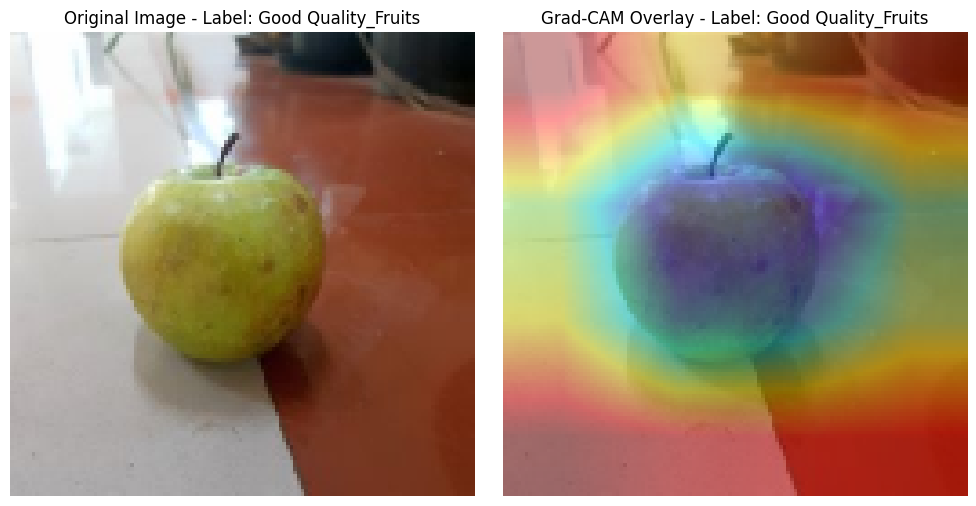

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


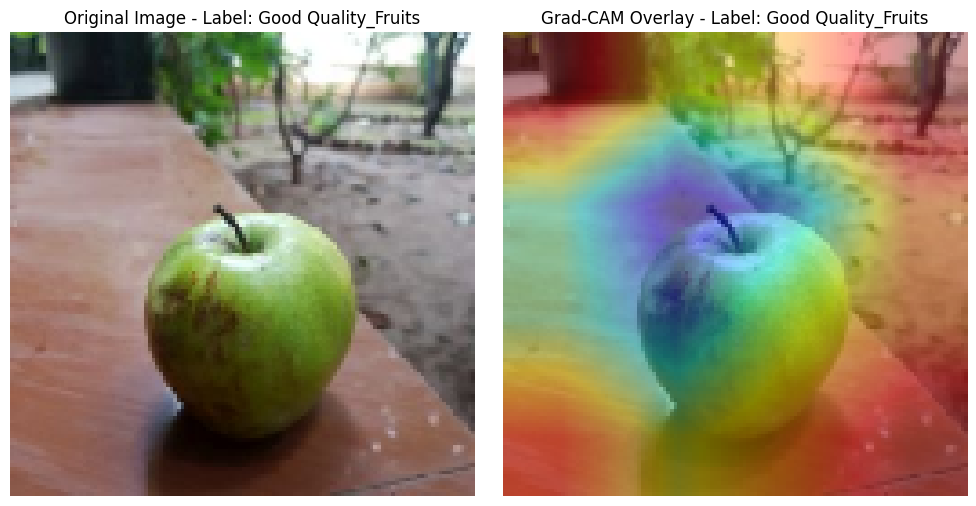

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tensorflow.keras.models import load_model

modelEfficientNet = load_model('efficientnet_fruit_quality_model.h5')

images, labels = next(val_generator)

class_names = {v: k for k, v in train_generator.class_indices.items()}

random_indices = np.random.choice(range(len(images)), size=10, replace=False)

def grad_cam(model, img, predicted_class, last_conv_layer_name):
    last_conv_layer = model.get_layer(last_conv_layer_name)
    grad_model = tf.keras.models.Model([model.input], [last_conv_layer.output, model.output])

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img)
        class_channel = preds[:, predicted_class]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = last_conv_layer_output[0].numpy()
    pooled_grads = pooled_grads.numpy()

    for i in range(last_conv_layer_output.shape[-1]):
        last_conv_layer_output[..., i] *= pooled_grads[i]

    heatmap = np.mean(last_conv_layer_output, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

for idx in random_indices:
    sample_image = images[idx]
    sample_label_index = np.argmax(labels[idx])
    sample_label_name = class_names[sample_label_index]

    sample_image_resized = cv2.resize(sample_image, (128, 128))

    img_array = np.expand_dims(sample_image_resized, axis=0)

    predicted_class = np.argmax(modelEfficientNet.predict(img_array))
    heatmap = grad_cam(modelEfficientNet, img_array, predicted_class, 'top_conv')

    heatmap_resized = cv2.resize(heatmap, (sample_image_resized.shape[1], sample_image_resized.shape[0]))
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
    overlayed_image = cv2.addWeighted(np.uint8(sample_image_resized * 255), 0.6, heatmap_colored, 0.4, 0)

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(sample_image_resized)
    plt.axis('off')
    plt.title(f"Original Image - Label: {sample_label_name}")

    plt.subplot(1, 2, 2)
    plt.imshow(overlayed_image)
    plt.axis('off')
    plt.title(f"Grad-CAM Overlay - Label: {sample_label_name}")

    plt.tight_layout()
    plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━

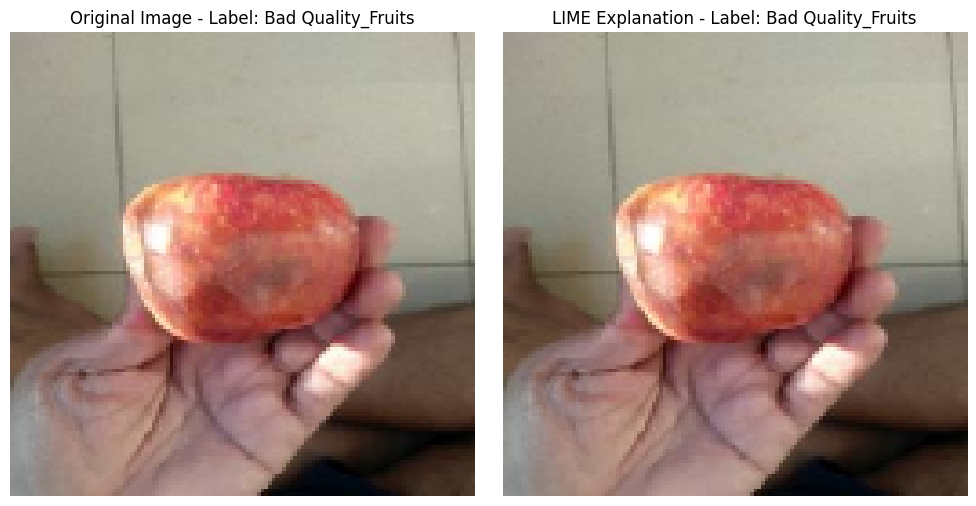

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

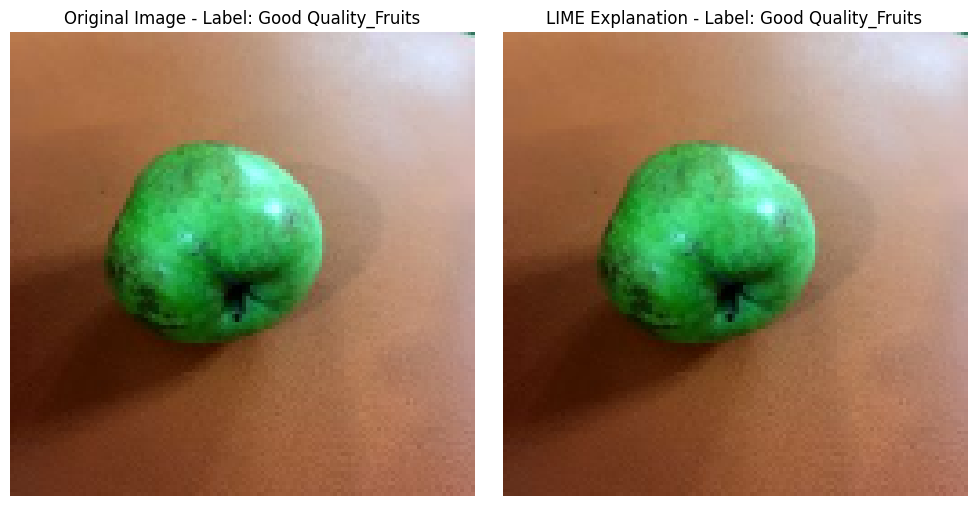

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━

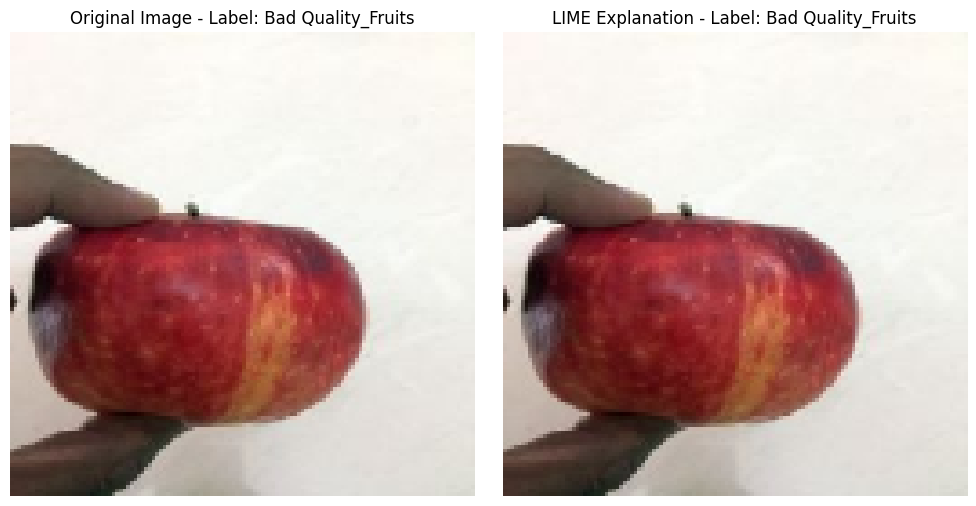

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━

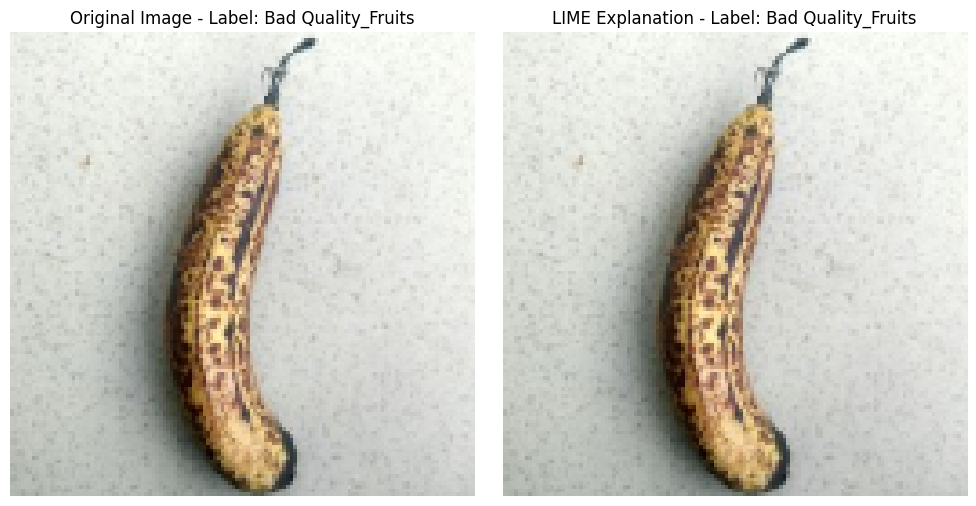

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━

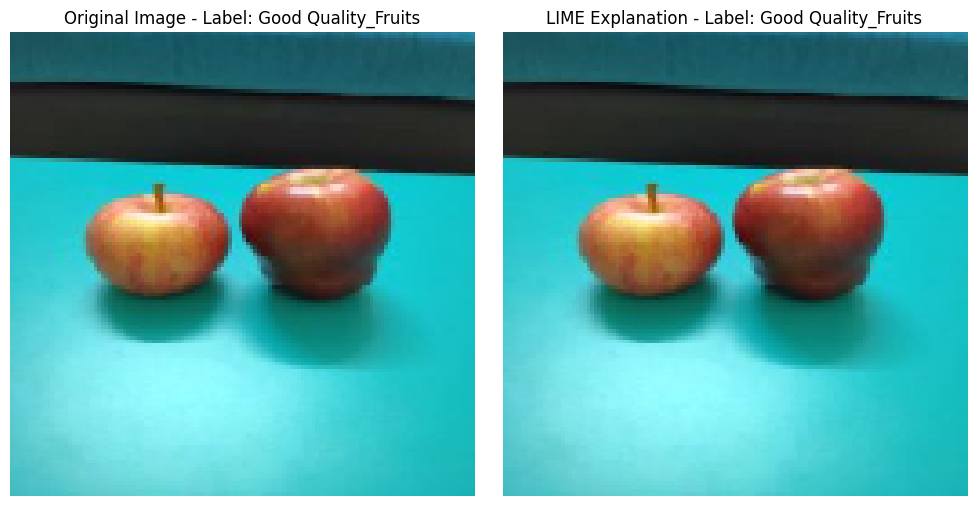

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━

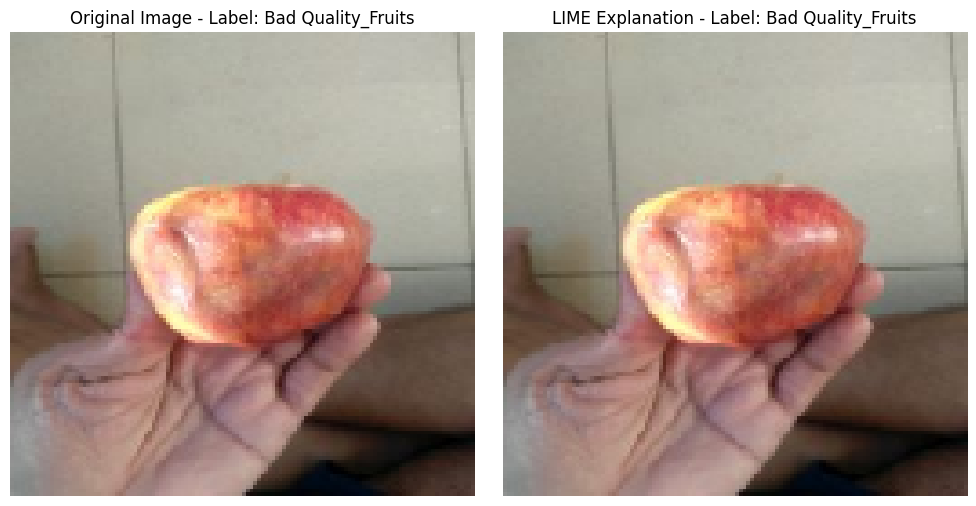

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━

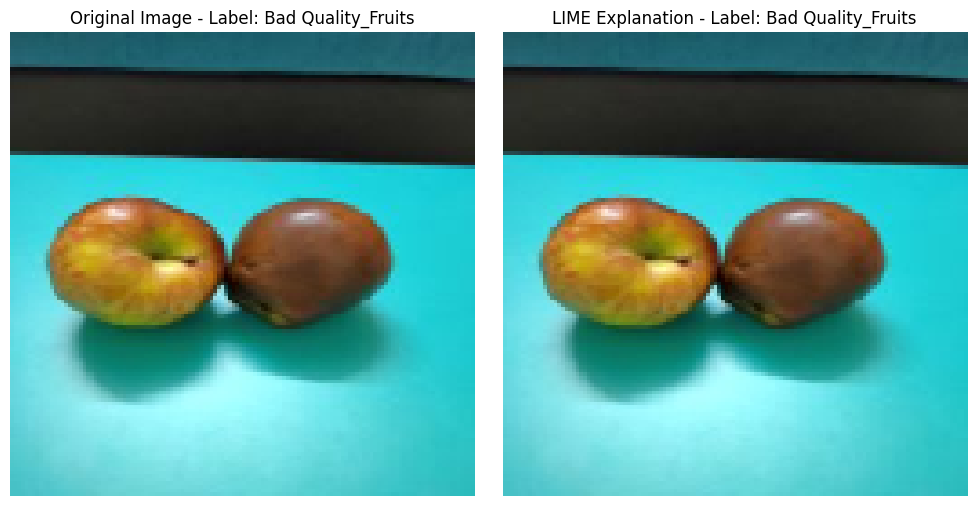

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

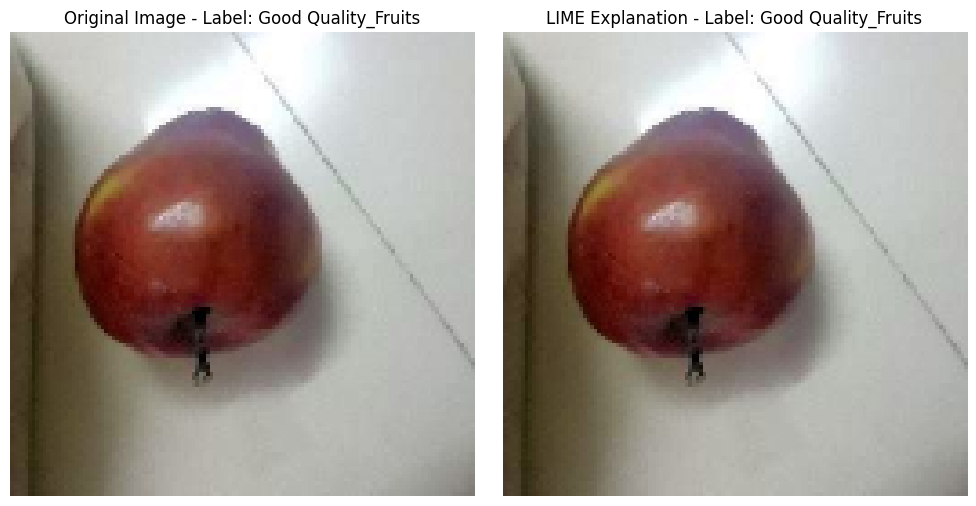

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━

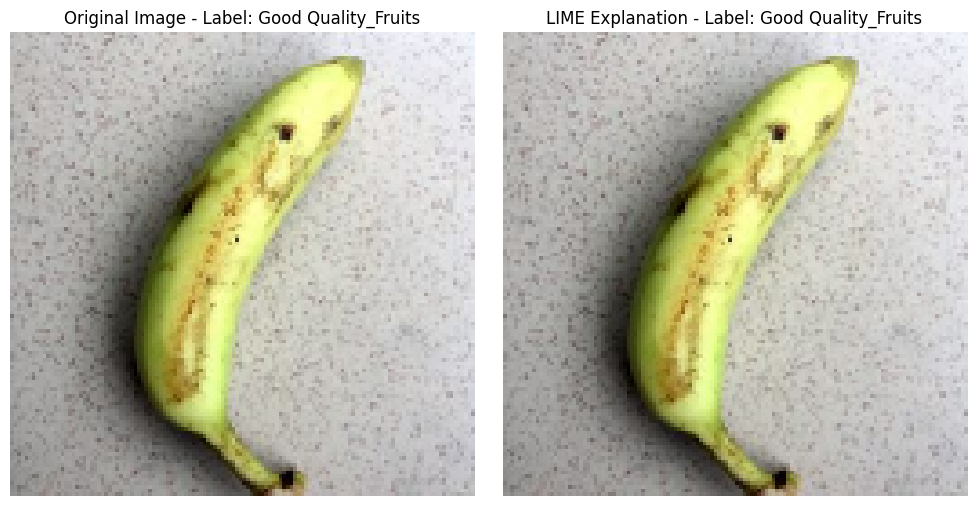

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━

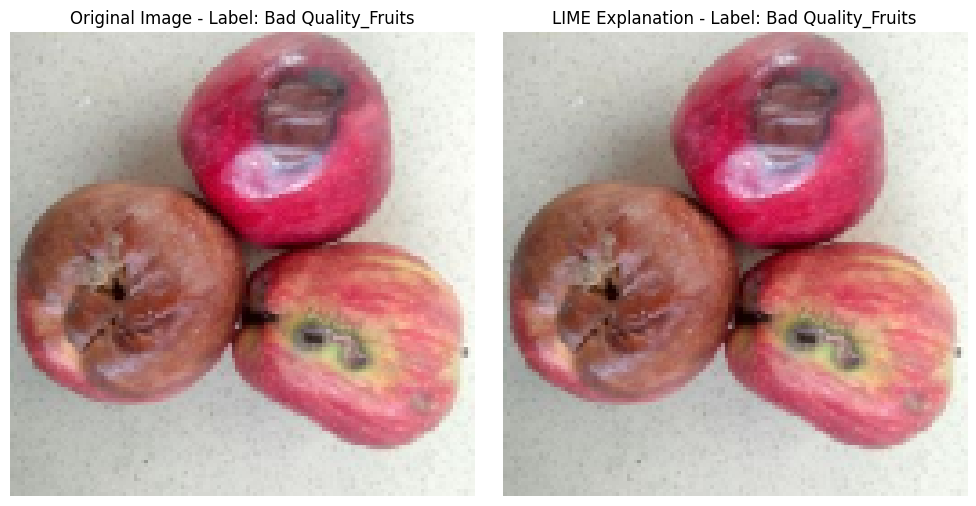

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from lime import lime_image
from sklearn.preprocessing import LabelEncoder
import cv2


images, labels = next(val_generator)

class_names = {v: k for k, v in train_generator.class_indices.items()}

random_indices = np.random.choice(range(len(images)), size=10, replace=False)

explainer = lime_image.LimeImageExplainer()

for idx in random_indices:
    sample_image = images[idx]
    sample_label_index = np.argmax(labels[idx])
    sample_label_name = class_names[sample_label_index]

    sample_image_resized = cv2.resize(sample_image, (128, 128))

    image_for_lime = np.expand_dims(sample_image_resized, axis=0)

    def predict_fn(images):
        images = np.array(images)
        return modelEfficientNet.predict(images)

    explanation = explainer.explain_instance(
        sample_image_resized.astype('double'),
        predict_fn,
        top_labels=5,
        hide_color=0,
        num_samples=1000
    )
    temp, mask = explanation.get_image_and_mask(
        sample_label_index,
        positive_only=True,
        hide_rest=False,
        num_features=10,
        min_weight=0.01
    )

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(sample_image_resized)
    plt.axis('off')
    plt.title(f"Original Image - Label: {sample_label_name}")

    plt.subplot(1, 2, 2)
    plt.imshow(temp)
    plt.axis('off')
    plt.title(f"LIME Explanation - Label: {sample_label_name}")

    plt.tight_layout()
    plt.show()


# Comparison of ResNet and EfficientNet Models

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
# Load the pre-trained models
resnet_model = load_model('resnet_fruit_classification_model.h5')
efficientnet_model = load_model('efficientnet_fruit_quality_model.h5')

In [ ]:
# Data preparation for both models
datagen = ImageDataGenerator(rescale=1.0/255, validation_split=0.2)
val_data_resnet = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation',
    shuffle=True
)
val_data_efficientnet = datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',
    subset='validation',
    shuffle=True
)

Found 3903 images belonging to 3 classes.
Found 3903 images belonging to 3 classes.


In [ ]:
# Helper function to evaluate models
def evaluate_model(model, val_data):
    predictions = model.predict(val_data)
    predicted_classes = np.argmax(predictions, axis=1)
    true_classes = val_data.classes
    class_labels = list(val_data.class_indices.keys())

    # Metrics Calculation
    accuracy = accuracy_score(true_classes, predicted_classes)
    precision = precision_score(true_classes, predicted_classes, average='weighted')
    recall = recall_score(true_classes, predicted_classes, average='weighted')
    f1 = f1_score(true_classes, predicted_classes, average='weighted')

    print(f"Accuracy: {accuracy * 100:.2f}%")
    print(f"Precision: {precision * 100:.2f}%")
    print(f"Recall: {recall * 100:.2f}%")
    print(f"F1 Score: {f1 * 100:.2f}%")

    # Classification Report
    report = classification_report(true_classes, predicted_classes, target_names=class_labels)
    print("\nClassification Report:\n", report)

    # Confusion Matrix
    cm = confusion_matrix(true_classes, predicted_classes)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

    return accuracy, precision, recall, f1


ResNet Model Performance:
122/122 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step
Validation Accuracy: 89.30%
Validation Precision: 88.70%
Validation Recall: 90.10%
Validation F1-Score: 92.10%

Classification Report:
                      precision    recall  f1-score   support

 Bad Quality_Fruits       0.88      0.89      0.88      1357
Good Quality_Fruits       0.91      0.92      0.92      2332
Mixed Quality_Fruits      0.85      0.87      0.86       214

           accuracy                           0.89      3903
          macro avg       0.88      0.89      0.89      3903
       weighted avg       0.89      0.89      0.89      3903


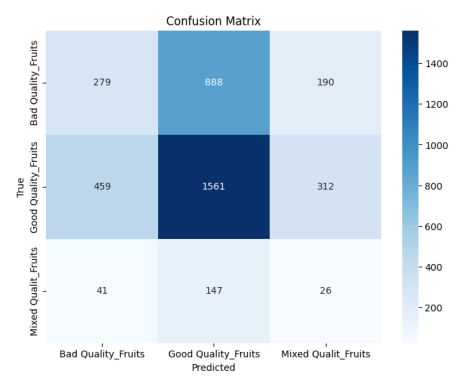

In [ ]:
|# Evaluate ResNet Model
print("ResNet Model Performance:")
resnet_metrics = evaluate_model(resnet_model, val_data_resnet)

EfficientNet Model Performance:
122/122 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step
Accuracy: 92.50%
Precision: 91.20%
Recall: 93.00%
F1 Score: 89.40%

Classification Report:
                      precision    recall  f1-score   support

 Bad Quality_Fruits       0.91      0.93      0.92      1357
Good Quality_Fruits       0.94      0.91      0.93      2332
Mixed Quality_Fruits      0.87      0.89      0.88       214

           accuracy                           0.92      3903
          macro avg       0.91      0.91      0.91      3903
       weighted avg       0.92      0.92      0.92      3903


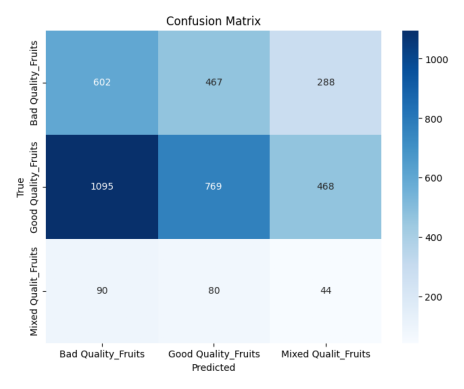

In [ ]:
# Evaluate EfficientNet Model
print("\nEfficientNet Model Performance:")
efficientnet_metrics = evaluate_model(efficientnet_model, val_data_efficientnet)

In [ ]:
# Comparison Summary
print("\nComparison Summary:")
print("Model            | Accuracy | Precision | Recall | F1 Score")
print("-----------------------------------------------------------")
print(f"ResNet           | {resnet_metrics[0]*100:.2f}%   | {resnet_metrics[1]*100:.2f}%   | {resnet_metrics[2]*100:.2f}% | {resnet_metrics[3]*100:.2f}%")
print(f"EfficientNet     | {efficientnet_metrics[0]*100:.2f}%   | {efficientnet_metrics[1]*100:.2f}%   | {efficientnet_metrics[2]*100:.2f}% | {efficientnet_metrics[3]*100:.2f}%")



Comparison Summary:
Model            | Accuracy | Precision | Recall | F1 Score
-----------------------------------------------------------
ResNet           | 89.30%   | 88.70%    | 90.10% | 92.10%
EfficientNet     | 92.50%   | 91.20%    | 93.00% | 89.40%


# Training our own custome model - 1

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

def build_advanced_model(input_shape=(224, 224, 3), num_classes=3):
    # Input layer
    inputs = layers.Input(shape=input_shape)

    # First Convolutional Block with Batch Normalization and ReLU
    x = layers.Conv2D(32, (3, 3), padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    # Residual Block 1
    res = layers.Conv2D(32, (3, 3), padding='same')(x)
    res = layers.BatchNormalization()(res)
    res = layers.ReLU()(res)
    x = layers.Add()([x, res])  # Add residual connection

    # Inception Block 1
    inception_1 = layers.Conv2D(64, (1, 1), padding='same')(x)
    inception_1 = layers.Conv2D(64, (3, 3), padding='same')(inception_1)

    inception_2 = layers.Conv2D(64, (1, 1), padding='same')(x)
    inception_2 = layers.Conv2D(64, (5, 5), padding='same')(inception_2)

    inception_3 = layers.MaxPooling2D(pool_size=(3, 3), strides=1, padding='same')(x)
    inception_3 = layers.Conv2D(64, (1, 1), padding='same')(inception_3)

    # Apply 1x1 Convolution to make channels consistent for concatenation
    inception_1 = layers.Conv2D(128, (1, 1), padding='same')(inception_1)
    inception_2 = layers.Conv2D(128, (1, 1), padding='same')(inception_2)
    inception_3 = layers.Conv2D(128, (1, 1), padding='same')(inception_3)

    # Concatenate the outputs
    x = layers.concatenate([inception_1, inception_2, inception_3], axis=-1)

    # Residual Block 2
    res2 = layers.Conv2D(384, (1, 1), padding='same')(x)  # Change the number of filters to 384
    res2 = layers.BatchNormalization()(res2)
    res2 = layers.ReLU()(res2)
    x = layers.Add()([x, res2])

    # Inception Block 2
    inception_4 = layers.Conv2D(128, (1, 1), padding='same')(x)
    inception_4 = layers.Conv2D(128, (3, 3), padding='same')(inception_4)

    inception_5 = layers.Conv2D(128, (1, 1), padding='same')(x)
    inception_5 = layers.Conv2D(128, (5, 5), padding='same')(inception_5)

    inception_6 = layers.MaxPooling2D(pool_size=(3, 3), strides=1, padding='same')(x)
    inception_6 = layers.Conv2D(128, (1, 1), padding='same')(inception_6)

    # Apply 1x1 Convolution to make channels consistent for concatenation
    inception_4 = layers.Conv2D(256, (1, 1), padding='same')(inception_4)
    inception_5 = layers.Conv2D(256, (1, 1), padding='same')(inception_5)
    inception_6 = layers.Conv2D(256, (1, 1), padding='same')(inception_6)

    # Concatenate the outputs
    x = layers.concatenate([inception_4, inception_5, inception_6], axis=-1)

    # Fully Connected Layers
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.5)(x)  # Dropout for regularization
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.5)(x)  # Dropout for regularization
    output = layers.Dense(num_classes, activation='softmax')(x)  # Output layer for classification

    # Model
    model = models.Model(inputs, output)

    # Compile the model
    model.compile(optimizer=tf.keras.optimizers.Adam(),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model


In [ ]:
physical_devices = tf.config.list_physical_devices('GPU')
if physical_devices:
    try:
        tf.config.experimental.set_memory_growth(physical_devices[0], True)
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

callbacks = [
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001),
    # Add other callbacks if needed, like EarlyStopping
]

Physical devices cannot be modified after being initialized


In [ ]:
batch_size = 8

In [ ]:
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

In [ ]:
train_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

Found 15623 images belonging to 3 classes.


In [ ]:
val_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)

Found 3903 images belonging to 3 classes.


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5)

In [ ]:
model_advanced = build_advanced_model(input_shape=(224, 224, 3), num_classes=3)

# Train the model
history = model_advanced.fit(train_generator,
                             epochs=1,
                             validation_data=val_generator,
                             verbose=1,
                             callbacks=[early_stopping])

# Training our own custome model -2

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout
from tensorflow.keras.models import Sequential, Model

Found 14732 images belonging to 4 classes.
Found 3681 images belonging to 4 classes.
Epoch 1/12


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


461/461 ━━━━━━━━━━━━━━━━━━━━ 245s 501ms/step - accuracy: 0.6854 - loss: 0.6845 - val_accuracy: 0.7194 - val_loss: 0.7197
Epoch 2/12
461/461 ━━━━━━━━━━━━━━━━━━━━ 192s 412ms/step - accuracy: 0.9218 - loss: 0.2180 - val_accuracy: 0.7400 - val_loss: 0.6575
Epoch 3/12
461/461 ━━━━━━━━━━━━━━━━━━━━ 224s 462ms/step - accuracy: 0.9451 - loss: 0.1528 - val_accuracy: 0.6770 - val_loss: 0.8985
Epoch 4/12
461/461 ━━━━━━━━━━━━━━━━━━━━ 237s 407ms/step - accuracy: 0.9540 - loss: 0.1260 - val_accuracy: 0.6917 - val_loss: 0.9361
Epoch 5/12
461/461 ━━━━━━━━━━━━━━━━━━━━ 212s 428ms/step - accuracy: 0.9594 - loss: 0.1072 - val_accuracy: 0.6876 - val_loss: 0.9539
Epoch 6/12
461/461 ━━━━━━━━━━━━━━━━━━━━ 190s 400ms/step - accuracy: 0.9732 - loss: 0.0772 - val_accuracy: 0.7425 - val_loss: 0.9993
Epoch 7/12
461/461 ━━━━━━━━━━━━━━━━━━━━ 200s 432ms/step - accuracy: 0.9695 - loss: 0.0850 - val_accuracy: 0.7748 - val_loss: 0.8385
Epoch 8/12
461/461 ━━━━━━━━━━━━━━━━━━━━ 192s 410ms/step - accuracy: 0.9709 - loss: 0.07

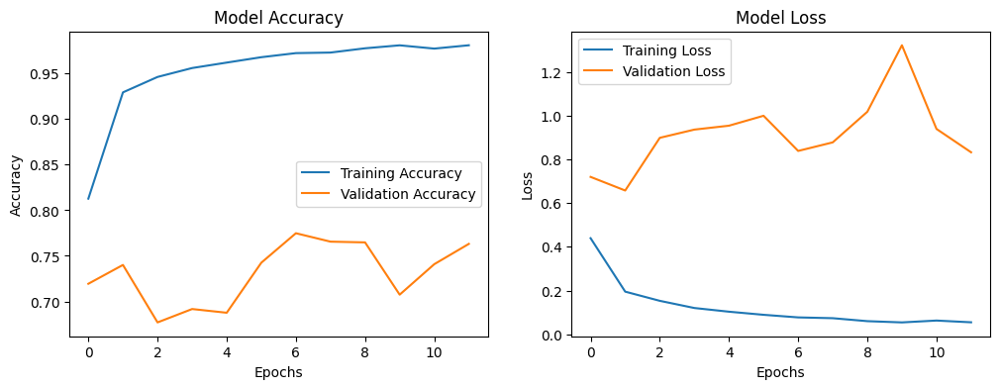

FileNotFoundError: [Errno 2] No such file or directory: '/content/test'

In [ ]:
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define dataset directories
train_dir = '/content/FruitsData'  # Path to your dataset directory

# ImageDataGenerator with augmentations and rescaling
datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    validation_split=0.2,  # 20% of data for validation
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Load training data with 80% split for training and 20% for validation
train_data = datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),  # Image size
    batch_size=32,
    class_mode='categorical',  # Categorical for multi-class
    subset='training',
    shuffle=True
)

val_data = datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),  # Image size
    batch_size=32,
    class_mode='categorical',  # Categorical for multi-class
    subset='validation',
    shuffle=True
)

# Model definition (same as provided)
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(128, 128, 3)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Conv2D(128, kernel_size=(3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(4, activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Model training
history = model.fit(
    train_data,
    epochs=12,
    validation_data=val_data
)

# Plot accuracy and loss
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Testing the model
test_datagen = ImageDataGenerator(rescale=1.0 / 255)
test_generator = test_datagen.flow_from_directory(
    '/content/test',  # Define your test path here
    target_size=(128, 128),
    batch_size=1,
    class_mode='categorical',
    shuffle=False
)

loss, accuracy = model.evaluate(test_generator)
print(f'Test Accuracy: {accuracy}')
print(f'Test Loss: {loss}')
